## Exploring the data

Global Terrorism Database (GTD) is maintained by the National Consortium for the Study of Terrorism and Responses to Terrorism (START). The current GTD is the product of several phases of data collection efforts, each relying on publicly available, unclassified source materials. These include media articles and electronic news archives, and to a lesser extent, existing data sets, secondary source materials such as books and journals, and legal documents.


#### GTD Definition of Terrorism

The GTD defines a terrorist attack as the threatened or actual use of illegal force and violence by a non-state actor to attain a political, economic, religious, or social goal through fear, coercion, or intimidation. In practice this means in order to consider an incident for inclusion in the GTD, all three of the following attributes must be present:

The incident must be intentional;

The incident must entail some level of violence or immediate threat of violence;

The perpetrators of the incidents must be sub-national actors;

The entire dataset has 135 features and about 180k rows of data

## Terrorist Activities Around The World

According to a survey, about 218 million people are affected by calamities, natural and man-made, per annum and about 68000 people loose their lives every year. The frequency of natural disasters like earthquakes, volcanoes, etc have remained broadly constant, but the number of terrorist activities have grown over the period.

The aim of this notebook is to explore the terrorist events around the world. Interactive Plots and Animations are used in this notebook, for making the exploration easy and more informative. This is my first try on **Folium**, which is a wrapper over the Leaflet.js Api. Some things that we will explore are the trends in terrorism over the year, the terrorism prone areas, etc. Since it is a geographic dataset, you will see a lot of geomaps.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
plt.style.use('fivethirtyeight')
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
from mpl_toolkits.basemap import Basemap
import folium
import folium.plugins
from matplotlib import animation,rc
import io
import base64
from IPython.display import HTML, display
import warnings
warnings.filterwarnings('ignore')
from imageio import imread
import codecs
from subprocess import check_output
import matplotlib
import numpy as np
import seaborn as sns

In [2]:
print(check_output(["ls", "./"]).decode("utf8"))

1873829_HAFIZ_MUHAMMAD_HASSAN.pptx
Motivation.png
Presentation.pptx
Terrorism.ipynb
animation.gif
globalterrorismdb_0718dist.csv
kaggle.png
mymap
~$globalterrorismdb_0617dist.csv



## Terrorism Around The World

The Year 2017 has witnessed about 1045 terror attacks till now, which has claimed 6000+ lives. According to a survey, there is atleast 1 terrorist attack taking place each day somewhere around the world. One such noxious attack took place at Las Vegas on 1st October 2017, claiming 59 lives and injuring 500+ people.
In this dataset, we will be exploring the terror attacks over the world from 1970-2016, finding the most affected countries, the most notorious groups, their motives,etc.

## 1.1 Getting Data Ready

In [3]:
terror=pd.read_csv('./globalterrorismdb_0718dist.csv',encoding='ISO-8859-1')
terror.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
terror=terror[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
terror['casualities']=terror['Killed']+terror['Wounded']
terror.head(3)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0


In [4]:
terror.isnull().sum()

Year                0
Month               0
Day                 0
Country             0
Region              0
city              434
latitude         4556
longitude        4557
AttackType          0
Killed          10313
Wounded         16311
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
casualities     16874
dtype: int64

### 1.2 Some Basic Analysis

In [5]:
print('Country with Highest Terrorist Attacks:',terror['Country'].value_counts().index[0])
print('Regions with Highest Terrorist Attacks:',terror['Region'].value_counts().index[0])
print('Maximum people killed in an attack are:',terror['Killed'].max(),'that took place in',terror.loc[terror['Killed'].idxmax()].Country)

Country with Highest Terrorist Attacks: Iraq
Regions with Highest Terrorist Attacks: Middle East & North Africa
Maximum people killed in an attack are: 1570.0 that took place in Iraq


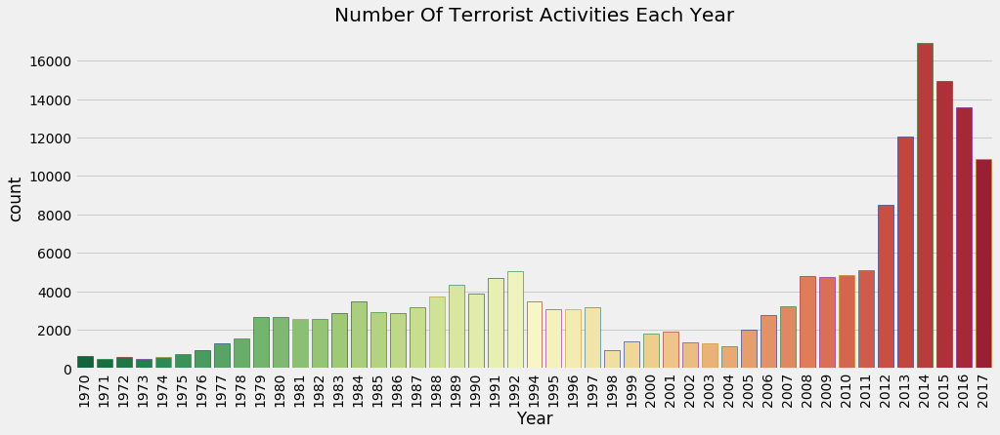

In [6]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=terror,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

Clearly the number of terrorist activities have gone up sharply after 2000.

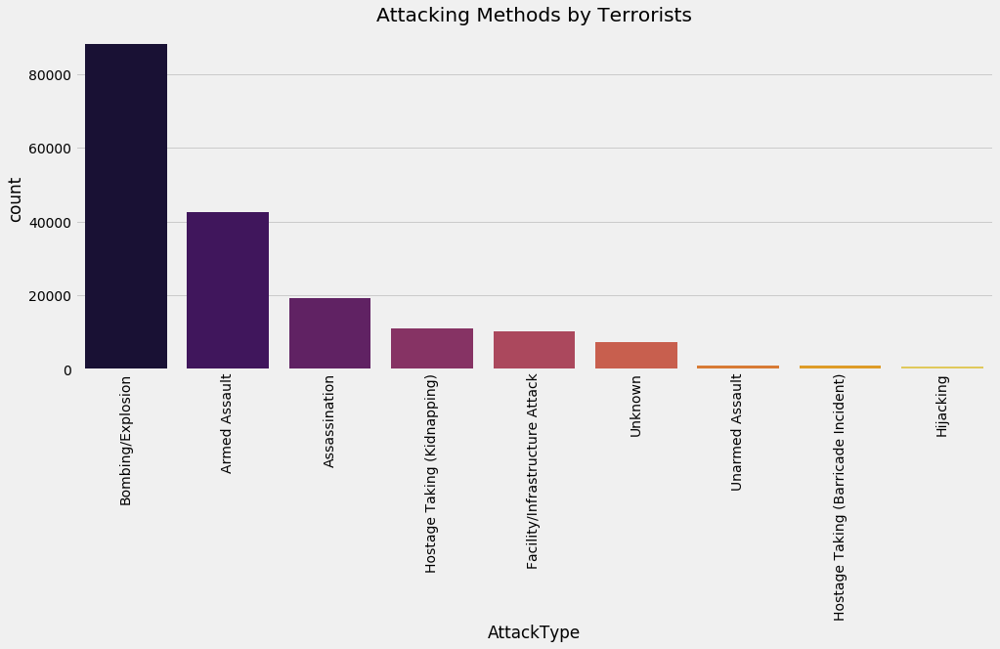

In [7]:
plt.subplots(figsize=(15,6))
sns.countplot('AttackType',data=terror,palette='inferno',order=terror['AttackType'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Attacking Methods by Terrorists')
plt.show()

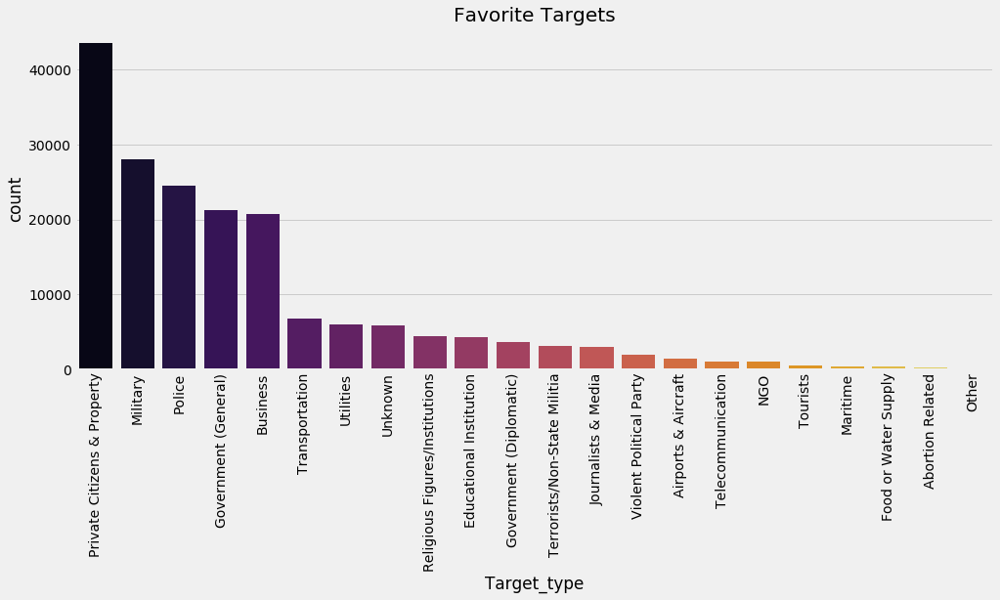

In [8]:
plt.subplots(figsize=(15,6))
sns.countplot(terror['Target_type'],palette='inferno',order=terror['Target_type'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Favorite Targets')
plt.show()

### 1.3 Global Terror Attacks

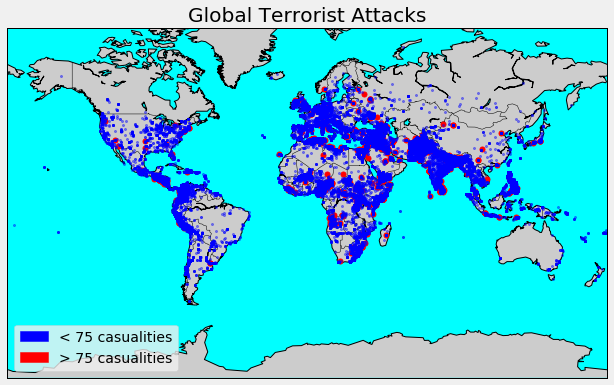

In [9]:
m3 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c',lat_0=True,lat_1=True)
lat_100=list(terror[terror['casualities']>=75].latitude)
long_100=list(terror[terror['casualities']>=75].longitude)
x_100,y_100=m3(long_100,lat_100)
m3.plot(x_100, y_100,'go',markersize=5,color = 'r')
lat_=list(terror[terror['casualities']<75].latitude)
long_=list(terror[terror['casualities']<75].longitude)
x_,y_=m3(long_,lat_)
m3.plot(x_, y_,'go',markersize=2,color = 'b',alpha=0.4)
m3.drawcoastlines()
m3.drawcountries()
m3.fillcontinents(lake_color='aqua')
m3.drawmapboundary(fill_color='aqua')
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.title('Global Terrorist Attacks')
plt.legend(loc='lower left',handles=[mpatches.Patch(color='b', label = "< 75 casualities"),
                    mpatches.Patch(color='red',label='> 75 casualities')])
plt.show()

The above basemap shows the places of attacks. The red circles are those that had more than 75 casualities(wounded+killed). Lets make an interactive map with Folium and get more information for each location.

In [10]:
terror_fol=terror.copy()
terror_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_fol=terror_fol[['latitude','longitude']][:5000]
country_fol=terror_fol['Country'][:5000]
city_fol=terror_fol['city'][:5000]
killed_fol=terror_fol['Killed'][:5000]
wound_fol=terror_fol['Wounded'][:5000]
def color_point(x):
    if x>=30:
        color='red'
    elif ((x>0 and x<30)):
        color='blue'
    else:
        color='green'
    return color   
def point_size(x):
    if (x>30 and x<100):
        size=2
    elif (x>=100 and x<500):
        size=8
    elif x>=500:
        size=16
    else:
        size=0.5
    return size   
map2 = folium.Map(location=[30,0],tiles='CartoDB dark_matter',zoom_start=2)
i=0;
for point in location_fol.index:
    i=i+1
    if(i>1000): #right now there is limit to show markers
        break
    info='<b>Country: </b>'+str(country_fol[point])+'</br><b>City: </b>: '+str(city_fol[point])+'</br><b>Killed </b>: '+str(killed_fol[point])+'</br><b>Wounded</b> : '+str(wound_fol[point])
    iframe = folium.IFrame(html=info, width=200, height=200)
    folium.CircleMarker(list(location_fol.loc[point].values),popup=folium.Popup(iframe),radius=point_size(killed_fol[point]),color=color_point(killed_fol[point])).add_to(map2)

In [11]:
map2

The color and size of each point is according to the number of people killed
in the attack. Click on each point to get more information about the attack

1.4 Terrorism By Region

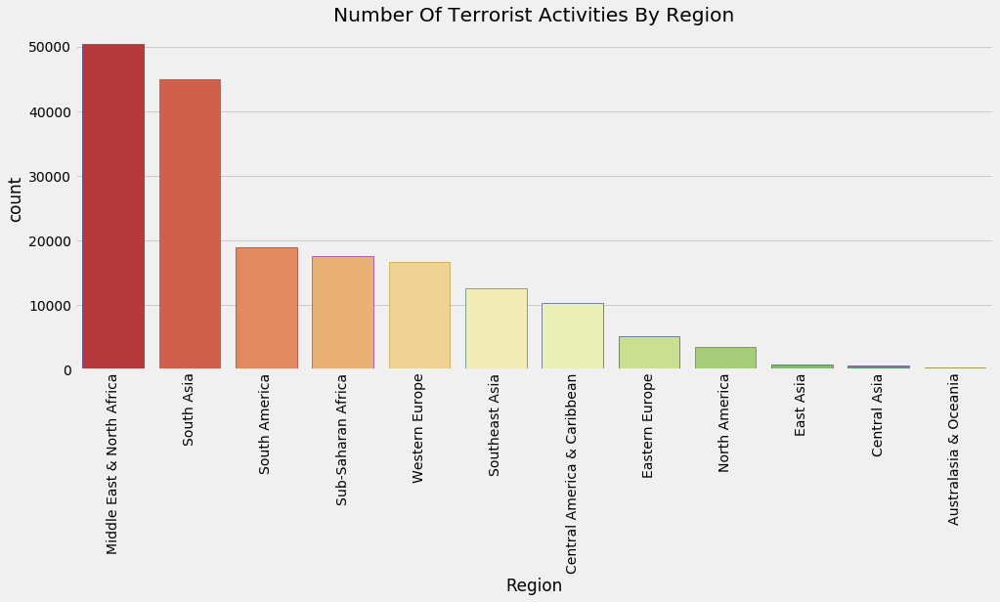

In [12]:
plt.subplots(figsize=(15,6))
sns.countplot('Region',data=terror,palette='RdYlGn',edgecolor=sns.color_palette('dark',7),order=terror['Region'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities By Region')
plt.show()

Middle East and North Africa are the most terrorism prone regions followed by South Asia. The Australian Region have experienced very few terrorist events. Collectively we can say that The African and Asian Continent experience the highest terrorist attacks. But why are these regions prone to terrorism? Does this have any relation to the mindset of the people? or any other reason??

## Trend in Terrorist Activities

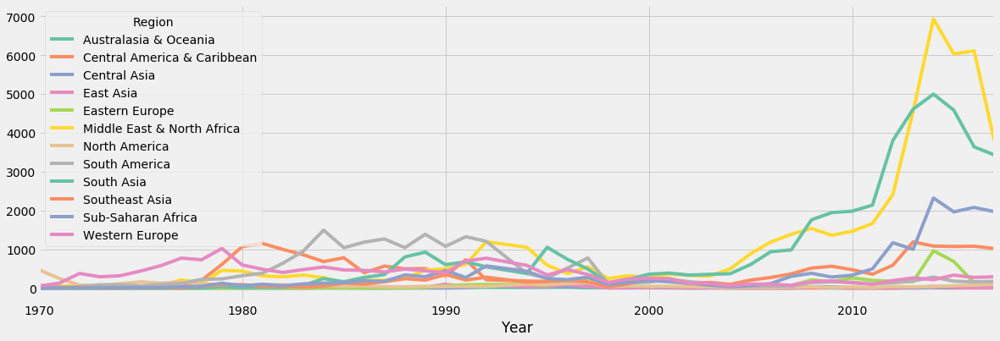

In [13]:
terror_region=pd.crosstab(terror.Year,terror.Region)
terror_region.plot(color=sns.color_palette('Set2',12))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

As seen already, Middle-East,North Africa,South Asia have seen a shoot in the number of terrorist activities over the years.

## AttackType vs Region

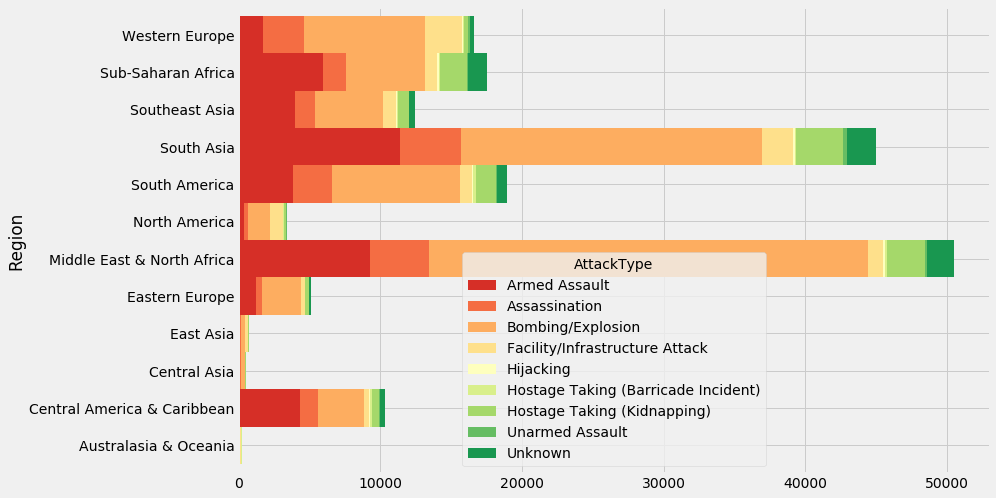

In [14]:
pd.crosstab(terror.Region,terror.AttackType).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',9))
fig=plt.gcf()
fig.set_size_inches(12,8)
plt.show()

Bombing and Armed assaults, as seen above are the most prominent types of Attack irrespective of Regions.

# 1.5 Terrorism By Country

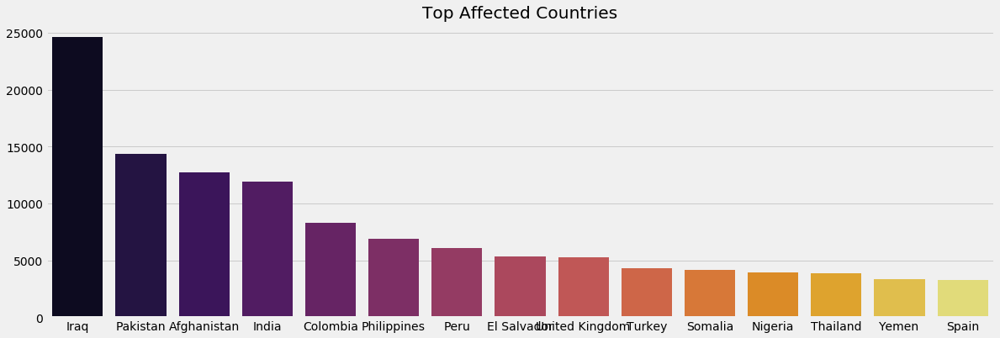

In [15]:
plt.subplots(figsize=(18,6))
sns.barplot(terror['Country'].value_counts()[:15].index,terror['Country'].value_counts()[:15].values,palette='inferno')
plt.title('Top Affected Countries')
plt.show()

Iraq has witnessed a very large number of terrorist activities followed by Pakistan. One thing to note is the countries with highest attacks, are mostly densely populated countries, thus it will eventually claim many lives. Let's check 

## Attacks vs Killed

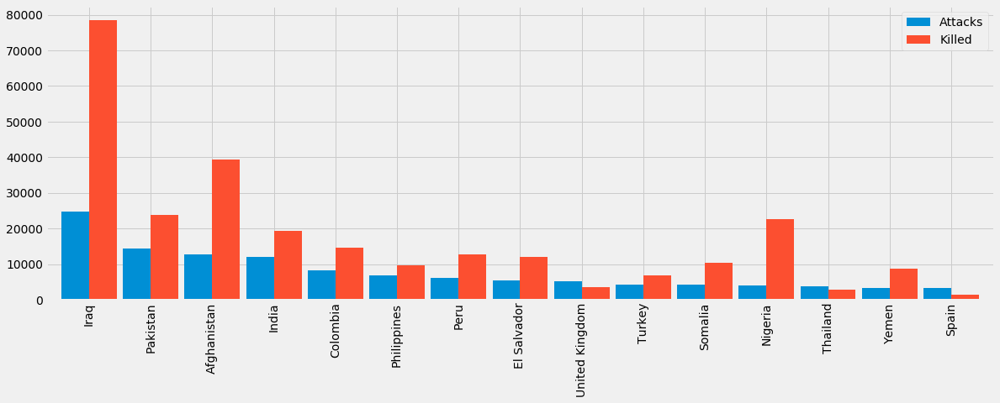

In [16]:
coun_terror=terror['Country'].value_counts()[:15].to_frame()
coun_terror.columns=['Attacks']
coun_kill=terror.groupby('Country')['Killed'].sum().to_frame()
coun_terror.merge(coun_kill,left_index=True,right_index=True,how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

Damn!! Look at the **killed** bar for Iraq. The number of killed is almost 3 folds more than attacks for Iraq. Thus the densely populated theory holds good.

## 1.5 Most Notorious Groups

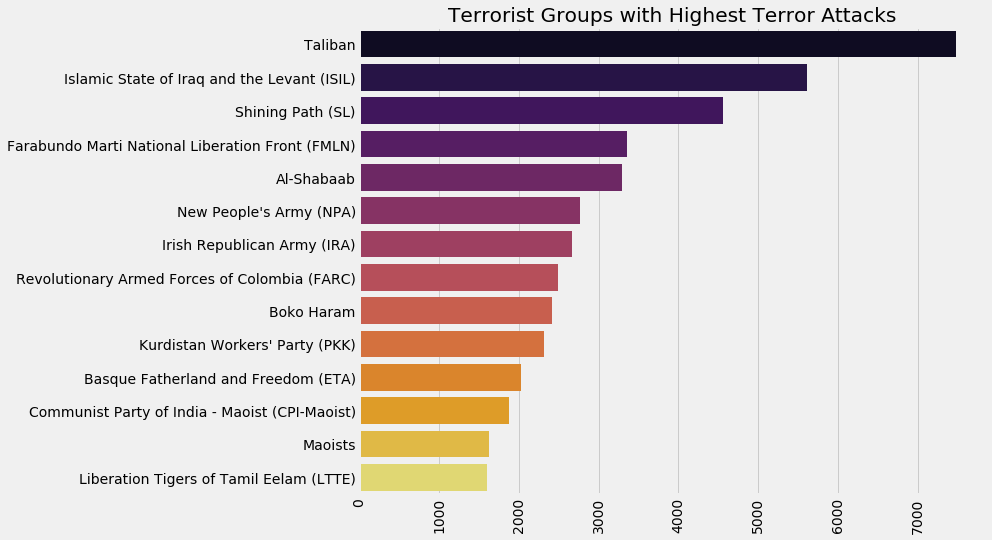

In [17]:
sns.barplot(terror['Group'].value_counts()[1:15].values,terror['Group'].value_counts()[1:15].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Terrorist Groups with Highest Terror Attacks')
plt.show()

## Activity of Top Terrorist Groups

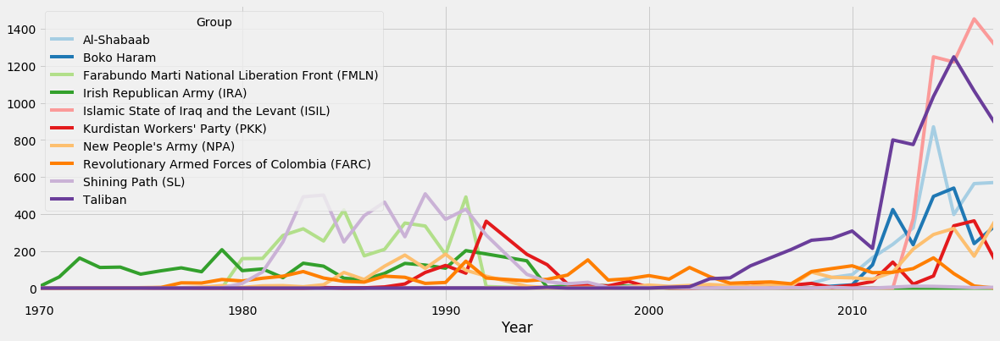

In [18]:
top_groups10=terror[terror['Group'].isin(terror['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.show()

The Irish Republican Army(IRA), is the oldest terrorist group started back in the 1960-1970, maybe after the World War 2 due to the mass killing. However, it has probably stopped its activities in the late 90's. Some of the groups that have started lately in 2000's like the ISIL and Taliban, have shown a shoot in the number of attacks in the past years. 

## Regions Attacked By Terrorist Groups

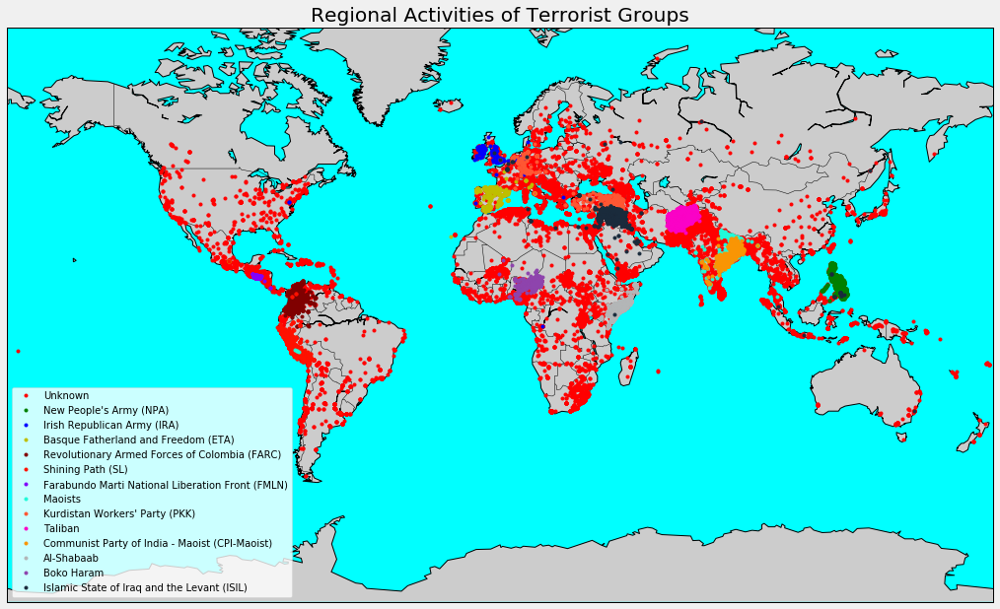

In [19]:
top_groups=terror[terror['Group'].isin(terror['Group'].value_counts()[:14].index)]
m4 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c',lat_0=True,lat_1=True)
m4.drawcoastlines()
m4.drawcountries()
m4.fillcontinents(lake_color='aqua')
m4.drawmapboundary(fill_color='aqua')
fig=plt.gcf()
fig.set_size_inches(22,10)
colors=['r','g','b','y','#800000','#ff1100','#8202fa','#20fad9','#ff5733','#fa02c6',"#f99504",'#b3b6b7','#8e44ad','#1a2b3c']
group=list(top_groups['Group'].unique())
def group_point(group,color,label):
    lat_group=list(top_groups[top_groups['Group']==group].latitude)
    long_group=list(top_groups[top_groups['Group']==group].longitude)
    x_group,y_group=m4(long_group,lat_group)
    m4.plot(x_group,y_group,'go',markersize=3,color=j,label=i)
for i,j in zip(group,colors):
    group_point(i,j,i)
legend=plt.legend(loc='lower left',frameon=True,prop={'size':10})
frame=legend.get_frame()
frame.set_facecolor('white')
plt.title('Regional Activities of Terrorist Groups')
plt.show()

The basemap clearly shows the regions of activity by the groups. ISIL is looks to be the notorious group in Iran and Iraq or broadly Middle-East. Similarly Taliban is concentrated in Afghanistan and Pakistan.

The Unknown markers, are maybe due to be an individual attack due to any resentment or personal grudges or any non-famous groups.

## 1.6  Terror Activities in India

In [20]:
terror_india=terror[terror['Country']=='India']
terror_india_fol=terror_india.copy()
terror_india_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terror_india_fol[['latitude','longitude']][:5000]
city_ind=terror_india_fol['city'][:5000]
killed_ind=terror_india_fol['Killed'][:5000]
wound_ind=terror_india_fol['Wounded'][:5000]
target_ind=terror_india_fol['Target_type'][:5000]

map4 = folium.Map(location=[20.59, 78.96],tiles='CartoDB dark_matter',zoom_start=4.5)
i=0
for point in location_ind.index:
    i = i + 1
    if i>1000:
        break
    folium.CircleMarker(list(location_ind.loc[point].values),popup='<b>City: </b>'+str(city_ind[point])+'<br><b>Killed: </b>'+str(killed_ind[point])+\
                        '<br><b>Injured: </b>'+str(wound_ind[point])+'<br><b>Target: </b>'+str(target_ind[point]),radius=point_size(killed_ind[point]),color=color_point(killed_ind[point]),fill_color=color_point(killed_ind[point])).add_to(map4)
map4

Click on markers for more information.

#### Most Notorious Groups in India and Favorite Attack Types

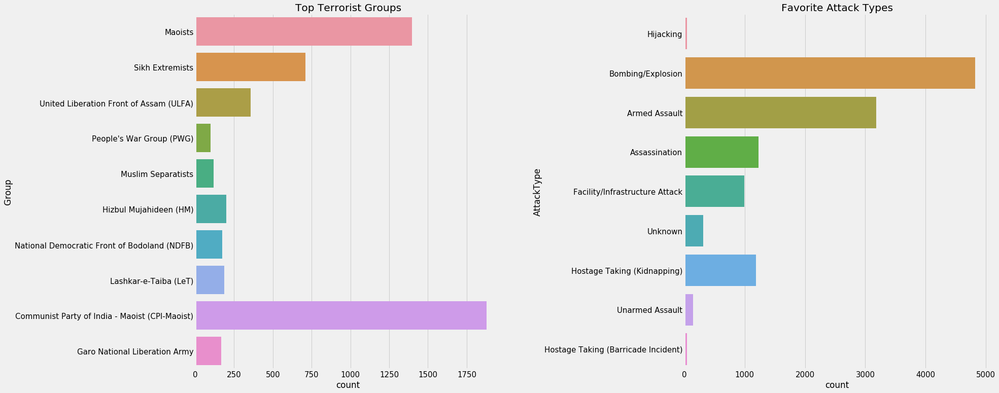

In [21]:
f,ax=plt.subplots(1,2,figsize=(25,12))
ind_groups=terror_india['Group'].value_counts()[1:11].index
ind_groups=terror_india[terror_india['Group'].isin(ind_groups)]
sns.countplot(y='Group',data=ind_groups,ax=ax[0])
ax[0].set_title('Top Terrorist Groups')
sns.countplot(y='AttackType',data=terror_india,ax=ax[1])
ax[1].set_title('Favorite Attack Types')
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

#### How did terrorism spread in India(Animation)

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.



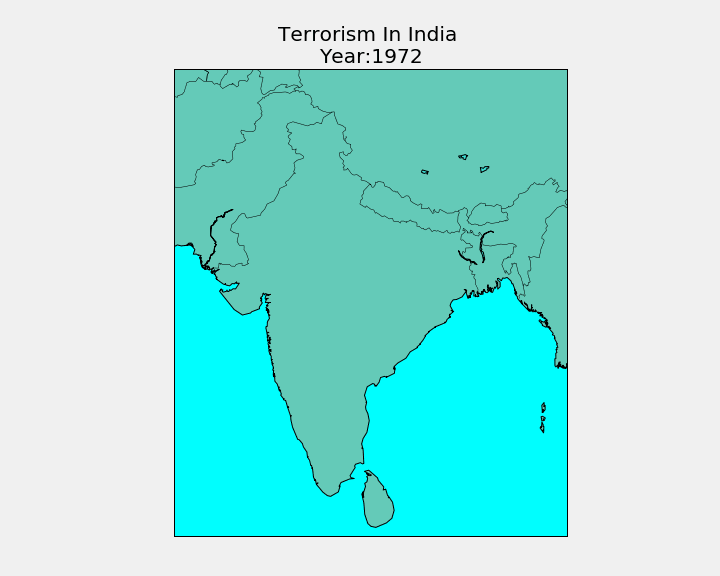

In [22]:
fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In India '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=67,llcrnrlat=5,urcrnrlon=99,urcrnrlat=37,lat_0=28,lon_0=77)
    lat_gif=list(terror_india[terror_india['Year']==Year].latitude)
    long_gif=list(terror_india[terror_india['Year']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terror_india[terror_india['Year']==Year].Killed,terror_india[terror_india['Year']==Year].Wounded)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
ani = animation.FuncAnimation(fig,animate,list(terror_india.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

The size of the marker is relative to the number of people killed + wounded.

The North-eastern and the Northern parts of India are the most terrorism prone areas. Jammu and Kashmir has witnessed highest attacks, and the numbers have gone up substantially since 1980's. The worst attack till date in India is the Mumbai Attack in 2006, which killed more than 200 people.

## 1.7 Terror Activities in USA

In [23]:
terror_usa=terror[terror['Country']=='United States']
terror_usa_fol=terror_usa.copy()
terror_usa_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_usa=terror_usa_fol[['latitude','longitude']]
city_usa=terror_usa_fol['city']
killed_usa=terror_usa_fol['Killed']
wound_usa=terror_usa_fol['Wounded']
target_usa=terror_usa_fol['Target_type']

map5 = folium.Map(location=[39.50, -98.35],tiles='CartoDB dark_matter',zoom_start=3.5)
i = 0
for point in location_usa.index:
    i = i + 1
    if i>1000:
        break
    info='<b>City:</b>'+str(city_usa[point])+'<br><b>Killed</b>: '+str(killed_usa[point])+'<br><b>Wounded</b>: '+str(wound_usa[point])+'<br><b>Target</b>: '+str(target_usa[point])
    iframe = folium.IFrame(html=info, width=200, height=200)
    folium.CircleMarker(list(location_usa.loc[point].values),popup=folium.Popup(iframe),radius=point_size(killed_usa[point]),color=color_point(killed_usa[point])).add_to(map5)

map5

#### Most Notorious Groups in USA and Favorite Attack Type

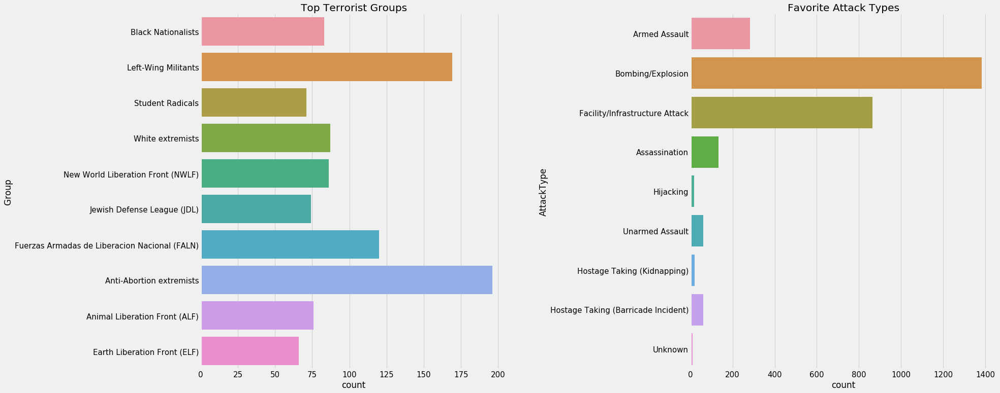

In [24]:
f,ax=plt.subplots(1,2,figsize=(25,12))
usa_groups=terror_usa['Group'].value_counts()[1:11].index
usa_groups=terror_usa[terror_usa['Group'].isin(usa_groups)]
sns.countplot(y='Group',data=usa_groups,ax=ax[0])
sns.countplot(y='AttackType',data=terror_usa,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Favorite Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.



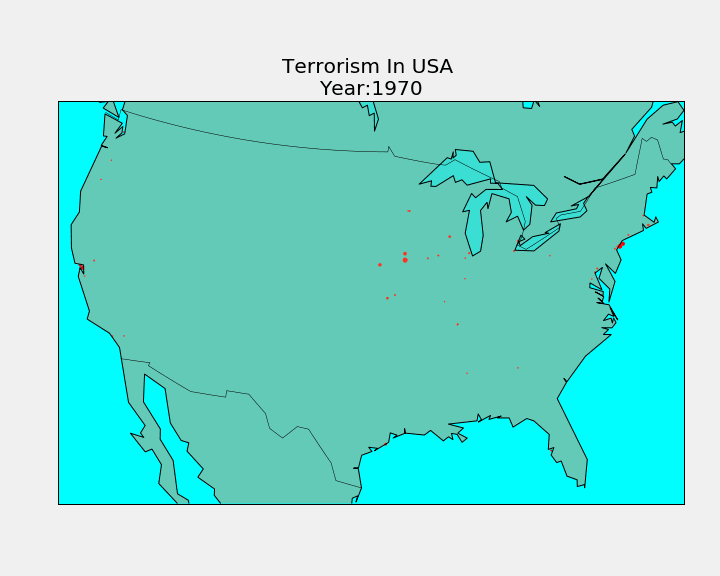

In [25]:
fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In USA '+'\n'+'Year:' +str(Year))
    m6 = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
        projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    lat_gif1=list(terror_usa[terror_usa['Year']==Year].latitude)
    long_gif1=list(terror_usa[terror_usa['Year']==Year].longitude)
    x_gif1,y_gif1=m6(long_gif1,lat_gif1)
    m6.scatter(x_gif1, y_gif1,s=[killed+wounded for killed,wounded in zip(terror_usa[terror_usa['Year']==Year].Killed,terror_usa[terror_usa['Year']==Year].Wounded)],color ='r') 
    m6.drawcoastlines()
    m6.drawcountries()
    m6.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m6.drawmapboundary(fill_color='aqua')
ani = animation.FuncAnimation(fig,animate,list(terror_usa.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

USA doesn't witness many terror attacks as compared to India.There are very few attacks that have claimed a very large number of lives. Also the number of casualities on an average is less as compared to that of India.

It has however witnessed one of the worst terrorist attacks in 2001 in New-York, which killed more than 1500 people.

## 1.8 Motive Behind Attacks

Motive simply means the reason for doing something. Now this reason may be anything, personal grudges, revolt against government, religious sentiments, etc. In this part we will try to analyse what are the main reasons behind the terrorist activities.

For this we will use NLTK for Natural Language Processing. The reason for using NLP is because if we simply take the count of words and make a wordcloud, many useless words like 'the','and,'is', etc will have the highest count as they are very common in english language. Thus using NLTK, we can filter out these words and find other important words.

In [26]:
kaggle=b'/9j/4AAQSkZJRgABAQEAYABgAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAJYAlgDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD3+iiigAooooAK83+Oelf2n8Lr6RV3SWMsd0o+h2sfwV2NekVn67piazoGo6XJjbeW0kBz23KRn9aAPhCinSI8UjRyKVdCVZT1BFNoA9T/AGf9UFj8SltWI239pLCM/wB4YkH/AKAfzr6sr4d8F6t/YfjbRdSLbUgvIzIf9gsA3/jpNfcVABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHxZ8TdI/sT4k69ZhdqG6MyAdAsmJAB9A2Pwrk69m/aO0n7N4v03VFXC3toYyfV425/R1rxmgAr7i8Gat/bvgrRtT3Ze4tI2kP8AtgYb/wAeBr4dr6p/Z91b7d8OTZM2X0+7kiA9FbDg/mzflQB6tRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHj/7RWmfavAtnqCrl7K9XcfRHUg/+PBK+YK+6PE3h2y8V+HbzRNQMgt7pQGaMgMpBDAjPcECvnb41fDjT/B1rot7ots8dkyG1uHZtxaUfMrN/tMN3Tj5egoA8gr6f+BXgvX/AArZ395qghjtdThhlhiWTc4I3EEgcDhvX09K+YK+5PB14uoeCtDu1ORLYQsfY7BkfnmgDbooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigBskiRRtJI6pGgLMzHAUDqSa8G+JXxM8LeNfDeqeGtMN5Ldxj7RBcmICFzF87YJbd9wPj5a9o8RmxHhnVP7TlMVgbSVbhx1WMqQx+uM18KBipypIOCOPegBK+jvhN8UvDejfDu30/XtWS0uLKV4lRkd2ZCdykBQTj5iPwr5xooA+pdR/aG8HWoItIdSvW7GOEIv5sQf0rkdS/aVvX3DS/DtvF/de6uGkz/wFQv8AOud+Dvw50Hx6uqSatdXiyWTx7Ybd1QMrBuSSCf4T0xXb+NP2fLe7WyPg5rayMastyt7PIRJ0wwOG56gjAHSgDzrUvjn471DcI9SgskbqtrbqP1bcw/Oui+E/xZ8Qv4wtNG1y/l1Cz1CTylabl4pD90g9cE4BB9cj34Tx38PNU+H9xYw6lcW0/wBsjZ0e3LFQVIBHzAeo/OvQvgB4Ee81I+Lr6PFralo7JWH+skxhn+igkfU+1AH0fRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBU1XT4tW0i902fPk3cDwPj+6ylT/OvCPEXwu+Hfw/8ADaTeJNQ1O6vJSfJMB2NMy4JRVAIUHuWPfg9K+gq8E/aU1Ira6Fpf2YbXeS488/7IC7R/31k/hQB8+NjcdoIXPAJyaSiigD1z9njVvsXj+fT2b5L+zdQPV0IYf+Oh6+jdc8TaJ4bgWXWNTtbMMCUWWQBnwOdq9T+FfGXg/X/+EX8X6XrRR3S0nDyKn3mQ8MB7lSam8beLr3xt4muNXuxsVvkggzkQxjoo/mT3JNAHWSyar8b/AIoqi+ZDYDgDqLW2U8n03HP4swHSvqbTNNtNH0y206whENrbRiOKMdgP5n3r5+/Zy8QWFpqWp6HOkUd5eBZYJjw0m0HMefbO4D/er6MoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvOPjXqeh6d4CuV1a0W5ubpXt7H92paOUrneCfugYBOOvAr0euM+J3hXS/FHg27OpiYf2fFJdwvC4VgyoTjkEYPfigD4zooooAK1pvDWrw6Da639ilfTbgMVuY1LIhVipVyPunIzg9iKya0rHxFrWl27W1hq19bW7gh4Yp2WNgeoKg4Oe+RQBQhmlt5o5oJHiljYMjoxVlI6EEdDXt/wAMvjlNYNFo/i6eS4tScRai5LyR57Sd2X/a6j3HTyq88L3cHhLT/EsP76wuZHglYD/UTKx+VvqoDA+5HbnCoA++re4hu7eO4t5UmhkUMkkbBlYHoQR1FS18a+Cfij4i8DnybKZbnTyctZXOSgPcqeqn6ceoNfSHgD4paL4+Vre3SSz1OKPfLaSkHI6Eo38QHHYHnpQB3VFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRR0rzTxV8cPCnhudrW3kk1W7UkMlmQUQ+hc8flmgD0uivlbxD8fvFuqzMNLMGkW2flWJBJIR7sw/kBXH3fxF8Z3rZm8UaqPaO6aMfkpAoA+2aK+LbL4n+OLBgYfE+otj/AJ7y+d/6Hmu/8N/tF6vZqsPiHTotRTPNxARDJj3XG0/htoA+k6K5Xwj8RPDnjWL/AIlV7i5Ay9pOAky/8BzyPcEiuqoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvmX47eOdZuPFF34Ujka20u1Ee+NDg3BZA+WI6qN3A6cZPPT6ar5h/aK0v7L45stQVcJe2YDH1dGIP/AI6UoA8eooooAKKKKAPRPDV5qmo/B/xR4f063+0eVdQXsydWWHneyj2aOPPsTXndelfAzVBYfEmCzdsQ6lby2j5AI6bxweOqAfjXF+JPD974W8QXmj6gm2e2cruxgSL/AAuPYjmgDJq9o+sX+gatb6pply1veW7bo5FAOOx4PBBHGDVGigD73sPtP9nW32xla68pfOKjAL4G7A7c5qxXz74L/aD8uPS9J8Q6cCBtgm1NJ8YHQOybfpk7vU47V9AghlDKQQRkEd6AFooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACsPxT4u0bwdpTX+sXSxJyI4l5klb0Ve5/Qd6o+PPHem+A9DN9efvbmXK2tqpw0zj+SjjJ7fUgV8ieKfFOqeMNcm1XVZt8r8JGv3Ik7Ko7Afr1PNAHT+Ovi54g8Y3MsMU8unaSflWzgkI3r/00YfeJ9Ont3rz6iigAooooAKKKKAHxSyQTJNDI8cqHcroxBU+oI6V7R4A+Pd9phi07xZ5l9Z8Kt6ozNGP9r++Pf73Xr0rxSigD7z0zVLHWtPhv9Nuorq0mGUlibIP+B9jyKuV8W+A/iBq3gPVhcWTmWylYfabN2+SUf+ysOxH6jivrnwv4n03xfoMGr6XKXgk+VlYYaNx1Rh2I/wACODQBs0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV4t+0hpf2jwnpWpquWtLsxH2WReT+aL+de01xnxY0s6v8L9egVcvFb/AGhfUeWQ5/RSPxoA+M6KKKACiiigDR0HVH0TxDp2qR53WdzHPgd9rA4/HFfXnxA8EWHxA8LPCBGL1U82xuscq2MgE/3W6H656gV8ZV9n/CzWP7b+Gmh3RbMkduLeT13RnZz9doP40AfG95Z3Gn3s9ndwtDcwSGOWNxgqwOCDUFezftAeC59O8RDxVbgvZaiVjmwP9VMqgD8GC5+ob2rxmgCW3t5ru5itraF5p5WCRxxqWZ2PAAA6mvs34aafrWlfD/S7LX2Y38UZBRjlo0ydiE9yFwPbp2r4ytrmazuobq2laKeFxJHIpwVYHII/Gvs34c+NIfHHhK31EFVvI/3V5EP4JQOTj0PUfXHY0AdbRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVieKvFeleDtEk1XVpikSnbGijLyvjhVHqcfQd62JZEhieWV1SNFLMzHAUDqSa+Pvir48fxz4paS3ZhpVnmKzQ9x3kI9Wx+QAoAw/GPi3UPGniGfVtQbBY7YYQflhjB4Uf49zk1gUUUAFFFFABRRRQAUUUUAFFFFABXb/DT4hXfgLXhKd8ulXLBby3HcdnX/AGhn8enuOIooA++LO7t9QsoLy0lWa2njWSKRTw6kZBH4VPXiP7PHi5r7R7vwxcvmWx/f22T1iY/Mv4Mc/wDA/avbqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKhu7aO9s57WYZinjaNx6qwwf51NRQB8EXtpJYX9xZzcS28rRP8AVSQf5VXrt/i7pf8AZPxR1yILhJ5hcqfXzFDn/wAeLD8K4igAooooAK+j/wBm7WPO0DWNGdvmtrhbhAf7rrg4+hT/AMer5wr1L4Bax/ZvxJjtGbEeo20kHPTcPnH/AKAR+NAH0t4n8P2vijw3f6LdgeVdRFQ2M7G6qw9wQD+FfEWp6dc6Rql1p17H5dzaytFKvoynB/D3r70r55/aH8GmK6tvFtpH8kuLe92jowHyOfqBtP0X1oA8GrufhX45fwP4tjmmdv7Lu8Q3iDsvZ/qp5+mR3rhqKAPv2ORJY1kjdXjcBlZTkMD0INOrxj4BeOv7W0V/C9/Lm809N1qWPMkHTb9VPH0I9DXs9ABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHjfx/8Z/2T4fj8NWjst3qa75mU42wA9P8AgRGPoG9a+ZK9Y/aGJPxJiyc40+LH/fT15PQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBu+DvEU/hXxZp2sQyMqwTL5wX+OInDr+Iz+lfcKsGUMpBUjIIPBr4Br7d8BXzaj8P/D905y72EIc56sFAP6g0AdFRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHzZ+0jpfkeJ9I1RVwt1aNCxA6tG2f5OPyrxOvqH9ojSxd+ArW/UfPZXikn0RwVP67K+XqACiiigArU8Oaq2heJtM1VSf8ARLqOYgdwrAkfiMisuigD79R1kRXRgysMgjoRVLW9HtPEGiXmk36b7W7iMbjuM9CPcHBHuKwPhhrH9ufDbQ7wtukW2EEh77o/kJP125/GuuoA+GPFPhy88KeI7zRr5f3tu+FfGBInVXHsRzWPX1R8cPAX/CTeHP7asId2qaYhYhRzNB1Zfcj7w/Ed6+V6ANPw/rl54a1+z1iwfbcWsgdQejDup9iMg/Wvtfw5r9l4o8P2es6e+be5j3AHqjdGU+4OQfpXwrXr/wACfHv9ga6fDt/LjTtSkHksx4in6D8G4H1C+9AH1BRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHzh+0jo5h17R9ZUHZc27WznsGRtw/MP/wCO14fX1r8dLPTbn4Y3k1+SsttLHJaMvXzSduPoQWz+favkqgAooooAKKKKACiiigAooooAKKKKACiiigAr7W+G1rJZfDbw9DKMP9hjcj03DcP0NfHGh2Uep6/pthNIY4rq6ihdwMlQzAE/rX3bFEkEKRRIEjRQqqOgA4AoAfRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHL/ABH0v+2fhzr1kF3O1m8iLjqyfOv6qK+KK+/XRZEZHUMrDBB6EV8Ja7praN4g1HTHzus7qSA577WI/pQBn0UUUAFFFFAH0n+zfrH2jwzq2ju2Ws7lZkB/uyLjA/FCf+BV7ZXyn8AdYOnfEhLJmxHqNtJDgnjco3g/X5SPxr6soAK+TPjP4B/4RDxN9vsYtukaixkiwOIpOrR+w7j2OO1fWdYXjDwvZ+MfDN3o14ABMuYpcZMUg+64+h/MEjvQB8O0oJBBBwR0Iq5q+lXmh6vdaXqERiurWQxyKfUdx6g9Qe4NUqAPrz4QePP+E08KLHdyZ1awCxXWTzIMfLJ+ODn3B9RXodfE/gHxdP4J8W2mrR7mgB8u6iX/AJaRH7w+o4I9wK+0bO7t9QsoLy0lWa2njWSKRTw6kZBH4UAT0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHgX7SmrSLDoWjo2InaS6kX1Iwqfzf86+fa9m/aQnLeNtLt+cJpwf2+aRx/7LXjNABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAEkE0ltcRzxNtkjcOh9CDkV9W/D74zaV40vE0q6t207VWX92jPujnIGTtOBg8E4Pbua+Tq6DwNfWOmeOtEvtTkaOzt7yOSR1/hwcgn2Bxn2zQB9v0U1HWRFdGDKwyrKcgj1p1ABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfInxv0r+zPilqLqMR3iR3SDHquG/8eVq+u6+ev2ldLC3Wg6so5dJbZz/ukMv/AKE9AHgtFFFABRRRQBp+HdWfQfEmm6smSbO5jmIH8QVgSPxGR+NfdEM0dxBHPC4eKRQ6MOhBGQa+BK+yvhLq/wDbPww0Sdm3SQw/Zn9QYyUGfwAP40AdrRRRQB4l8fPAP9paaPFmnRf6XZptvVUcyQ9n+q9/9n/dr5tr79kjSWNo5EV43BVlYZDA9QRXyB8WPAL+B/E7C2RjpN6TLaOf4P70ZPqufyI96AOBr6E/Z78bvNHN4QvpMmJWnsWY87erx/hncP8AgXpXz3V3SNVu9D1i01Sxk8u6tZVljb3HY+oPQj0NAH3lRWR4Z8QWninw5ZazZH9zdRhipPKN0ZT7g5H4Vr0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHzH+0Xpl3F42s9SaF/sc9kkSTY+XerPlc+uCD+NeOV9WftAFP8AhWLbpChN7DtAXO8/Nx7cZOfbHevlOgAooooAKKKKACiiigAooooAKKKKACiiigAooqW1tp727htbaJpZ5nEccajlmJwAPxoA+ufgnqM2o/CvSjO5d7cyW4Y/3Vc7R+C4H4V6DWP4V0KLwz4W03RoQuLSBUcqOGfqzfixJ/GtigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACvKv2gtNN78NTdAc2N5FMT7NmP+bivVawvGejHxB4M1jSkXdLc2rrEP+mmMp/48BQB8O0VMlpcyTPClvK0sYYuioSyhfvZHbGDn0xUNABRRRQBteGfCmseMNTfT9EtRcXCRGZwZFQKgIBOWI7sPzr6s+E3hHUvBfgoabqssbXUlw85SNtyxBgoC57/dz+NfK3g7xJceE/FVhrFu7gQSjzkU48yIn51Prkfrg9q+3oJ4rq3iuIHEkMqB0cdGUjIP5UASUUUUAFc7438I2fjXwxc6Rd4R2G+3mxkxSj7rfTsR3BNdFRQB8Garpl3ouq3WmX8RiuraQxyoexH8x3B7iqdfSXx6+H/9p6f/AMJZpsObu0Tbeoo5kiHR/qvf/Z/3a+baAPXfgT47bQfEQ8PXsuNO1OQCIseIp+in6Nwv12+9fUVfAKsyOroxVlOQQcEGvsv4XeL/APhMvA9nezSq1/CPIvAOvmL/ABH/AHhhvxPpQB2dFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHif7Rmvx23h7T9B+z75LyU3HmnpGI+OPc7vyB9a+bK+of2hPDj6p4Lt9Xgj3TaXNufHURPgN+TBPwzXy9QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAVueD9bi8OeMNK1ieEzQ2lwskiDqV6HHuAcj3FYdFAH31a3MN7aQ3VtIJIJ0WSN16MpGQR9QalryH4AeLP7Y8JS6FcSZutKYCPPVoWyV/I5H02169QAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBz3iPTbe28M+IbrT7S3t7+ewnzPFCod22NgkgZbn1r4hr75u4UuLKeCUgRyRsjE9ACMGvjDxPpHhjQ7OOy07WZdY1cOPPuIFCWkY5yqkjMhzj5gQOPyAOVooooA9A+HPhfwlrFvf6h4w1xdOtYGWO3iW4RJJmwSx2kFiANvQcluvGK9a/wCF4+B/C+k2mk6NHqWpQ2kSwxME2jaowMs5B/8AHa+ZaKAPoi9/aVsltl+weHLh5yORPcKqqfwBJ/SovB37Qd1qXiaGx8RWNjbWNy4jjntwymFicAvuYgr2J4x1r58p7RSJGkjIwR87GI4bHXFAH35RXJ/DXXz4l+Huj6hI5efyBDOWOSZE+Rifc4z+NdZQA10SSNo5FVkYEMrDIIPY18h/FrwA/gjxMz2kTf2PekyWrdRGf4oyfbt7Ed819fVgeMvCll4z8M3Wj3oC+YN0MuMmKQfdYf19QSKAPh+vQ/g945/4Q3xesd3Jt0rUNsFzk8RnPySfgSc+xNcXrWj3ugaxdaVqMJiu7aQpIvb2I9QRgg+hqhQB9/8AWivLfgf44bxR4VOl3sm7UtLCxlieZYv4G+oxtP0B716lQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBwfxl1M6Z8LNZZcb7hEtlz/ALbAN/47ur48r66+OFo938KtTMcZdoXilOOwDjJ/ImvkWgAooooAKKKKACiiigAooooAKKKKACiiigAooooA9Q+AU5i+KEEe8qJrWZMD+Ljdg/ln8K+r6+NvhNrdroHxL0i8vMiB3a3Zh/AZFKAn2BIz7V9k0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRSMyqMswGTgZPc0tABRRRQAUUUUAFFFcR8S/H8Xgfw1Jd2ptbjUnkWKG3kk6E5yzKDnAAP44oA7eivi+T4o+NX1w6uPEF2t10CqR5QHp5ZGzH1FU9X8e+LNd3DUfEF/KjdY1lMcZ/wCALhf0oA+jfjX4sstL8Aajp1vqEH9pXhW3ECSgyBScuSoOQNoI/Gvk+iigAooooAKKKKAOq+HvhODxr4vt9Fub5rOOVHfeqBmbaMlRk9cZ59ulenfHLwTp/hzwX4bOkwGO2sZpLVieWfzBv3Me5yjf99fSvKvAWrDQ/Huh6izbY4rtBI3ojHa//jrGvqP4waT/AGv8LtajVcyW8YukPp5ZDN/46GoA89/Zt13dbazoEjcoy3kI9j8j/wAk/Ove6+OPhFrv9gfEvSZnfbDcyfZJfQiT5Rn2DbT+FfY9ABRRRQB5X8ZfhqPF2k/2vpcI/tqyT7qj/j5iHJT/AHh1X8R3GPlUgqxVgQQcEHtX39Xzp8dPhp9imk8XaPB/o8rZ1CFB/q3P/LUexPX357nAB5d4G8WXHgvxZZ6xDuaJG2XEQP8ArYj95fr3HuBX2pZXtvqVhb31pKsttcRrLFIvRlIyD+VfBFfRH7Pfjfz7abwhfS/vIQZrEseqdXT8D8w9i3pQB7vRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAFTU7WzvtKu7XUFRrKaFknDnA2EfNk9uO9fCV4lvHfXCWkrS2yysIpGGC6Z4JHYkYr6V+O3j9NF0R/C9i+dQ1CL9+yn/Uwk8j6tgjHpn1FfMdABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAoJVgykgg5BHavu/Q706l4f02/Ygm5tYpiR/tID/AFr4Pr7N+FF4b74W+H5mOStt5Oc5+4xT/wBloA7KiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigD5A+L3inUtc8d6rYz30smn2N00MFvnCIV+UnA6nIPJ5rg4p5oM+VK8e7rsYjNdT8T4o4fid4iWNQqm9diB6nkn8SSa5KgDRi8Qa1blTDq9/HtGF2XLjA/A1ow+PvGFuMR+KNYAAwA17IwA9gTxXO0UAdbH8UPHEa7V8T6gR/tSbj+ZpknxL8bSNubxPqYP8AszlR+QrlaKANe98V+ItSBF9r2p3Kn+Ga7kYfkT71kUUUAFFFFABRRRQAUUUUAFFFFAB0r7g0C7i8V+A7C4nO9NR09RNz3ZMOPzyK+H6+rPgDq39ofDZLRmy+n3MkGD12nDj/ANDI/CgD5durefS9UmtnJS4tZmjJHBDK2P5ivt7wtrSeIvCul6uuP9LtkkYDs+PmH4NkfhXyl8YtJ/sj4o6wiriO5dbpD6+YAzf+Pbq9i/Z2137d4MvNHdsyadc5QekcnzD/AMeD/nQB7FRRRQAVFcW8N1bS29xGssMqFJEcZDKRggj0qWigD4++Knw8m8CeIM26s+j3hL2kp52esbH1Hb1GD6447SNVu9D1e11Swl8u6tZBJG3uOx9QehHoa+2fFPhqw8XeHrrR9RTMUy/K4HzROPuuvuD/AFHQ18Y+KPDd/wCE/EF1o+opiaFvlcD5ZEP3XX2I/wAKAPszwn4ltPF3hmz1qz4S4T5485MbjhlP0P58HvW3Xyv8DfHf/CN+Jf7Fvptul6m4UFjxFP0VvYH7p/4D6V9UUAFFFFABRRRQAUUUUAFFFFABWT4m1628MeG7/WrvmK0iL7c4Lt0VR7kkD8a1q8/+M2gaj4i+HV1b6YjS3EEqXJhT70qrnKgdzznHfHrigD5P1vWL3xBrV3quoSmW6upC7t2HoB6ADAA9BVCjpRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFfZnwmsjYfCzw/CRjdbGb/v4zP/AOzV8faZp8+rarZ6dbDM93MkEYP95iAP5191abYRaXpVnp0H+ptYEgj/AN1VCj9BQBaooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA+MPip/yVDxD/ANfZ/kK4+uw+Kf8AyVDxD/19n+Qrj6ACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr3L9mzVvK1rWtHZuJ7dLlAfVG2n/wBDH5V4bXc/CDVv7I+KOiyM2I7iU2rj18wFVH/fRWgDu/2k9J8vVtE1hV/10D2zn02NuX897flXN/AXXf7J+I0dlI+2HU4Xtzk8bx86n6/KR/wKvX/j7pP9o/DOW6Vcvp9zHcZ74JKH/wBDB/CvlvS9Qm0jV7PUrf8A11pOk8f1VgR/KgD70oqvYXkOo6fbX1u26C5iWaM+qsAR+hqxQAUUUUAFcD8VPh3D470DNuqx6zaKWtJTxv8AWNj6Hsex59c99RQB8DXNtcWN3La3MTw3ELlJI3GGRgcEEetfWnwe8df8Jl4TWG7l3atp4WG5yeZF/hk/EDB9wfWsL4zfCv8A4SO2k8RaHB/xN4V/fwIObpB3A/vgfmOOoFeEeA/F1z4I8W2urRhmhU+XdQj/AJaRH7w+o6j3AoA+2aKr2V7balYwXtnMs1tcRiSKRTwykZBqxQAUUUUAFFFFABRRRQAUUUUAfGfxV0GTw/8AEjWLdo9sNxMbuA4wCkh3cewJZf8AgNcZX1z8XPh0vjjQftFkgGtWKlrY5x5q9TGfr29D7E18kzQy288kE0bRyxsUdHGCrA4II7EUAMooooAKKKKACiiigAooooAKKKKACiiigAooooA9N+A+jRat8TIZpvu6fbPdqP7zAqg/Ivn8K+sq+aP2bpAPGOrR5X5rDOO/Ei/419L0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHxJ8QYpIviN4kWVSGOp3DAH+6ZGI/Qiubr0H4y6HqOl/EbU7u8tmjtr+Uy20v8Mi4GcH1HcV59QAUUUUAFFFFABRRTkR5HCIrMzHAVRkmgBtFKysjsjqVZTggjBBqexsLzU7yOzsLWa6uZDhIYULu3GeAOelAFeirF5Y3en3Bt721ntp16xzxlGH4Hmq9ABRRRQAUUUUAFT2d1LY3tvdwnEsEiyofRlOR/KoKKAPuDWraLxb4DvYIRuTU9PYw/V0yh/Mg18QEEEgjBHUGvsL4Oat/a/wALtHZmzJbI1q4z02MQo/752/nXzB8QNJ/sP4ga7p4Xakd27xr6I53r/wCOsKAPpD4F69/bPw2trZ2zPpsrWr+u37yH6bWA/wCA16XXzN+zpr32LxbfaLI5EeoW++MZ/wCWkfP/AKCW/KvpmgAooooAKKKKACvC/jB8H/t4n8S+Grf/AEvl7yyjH+u9XQf3vUd+o56+6UUAfNnwQ+Jg0e5TwprMuLCd/wDQ5nPEEhP3D/ssenofrx9J14h8XPg4mqJceIvDNvt1DJkurNBxP6sg7P3I/i+vW58FfiaddtV8M61NjVrZMW8sh5uI1HQ56uoH4jnsaAPY6KKKACiiigAooooAKKKKACvj/wCNVmLP4sa0Fi8uOYxTL/tbol3H/vrdX2BXzn+0npKRaxomrpHhriGS3kYd9hBXPv8AOfy9qAPDKKKKACiiigAooooAKKKKACiiigAooooAKKKKAOq+HHiJvC/j3SdSL7YPOENxzx5T/K2fpnP1Ar7Vr4Ar3P4T/Gh7FodA8VXLSWrEJbX8jZMPosh7r6N278dAD6MopAQyhlIIIyCO9LQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBVvdOsdSiWK/sre6jU7lSeJXAPrgisubwR4TnJMvhjRnJGMtYRZx9dtb1FAHIT/C7wNcff8M2AyMfu0Kf+gkVTk+DXw/lUBvDsYwc/LcTL/J67uigDzl/gZ4AZyw0iZAf4VvJcD82qeD4KfD6DB/sASMB1kupmz+G/H6V39FAHLWvw28FWf8AqvC+ln/rrbrJ/wChZres9M0/Txiysba2HpDCqfyFW6KAPmz9oTwfFpusW3ia1CJFqB8meNUx+9AJ3Z/2h+qk967n4HeCtF03wvZ+J4C1zqN/EQ0smMQgMVZEHbleT1OO3StX436T/anwu1B1XdJZPHdJ/wABO1v/AB1mrwW18e6ppnwjh0HTruS2kOoyiWSJ9riEorBQRyAWL5+n1oA+hPil4PHjrwhPY2P2d9UtZFlty7DKnOGXPbIz7ZA9K+PCCrFWBBBwQe1XtK1rU9D1Bb/S76e0ulP+sicgn2PqPY8VVurh7u7muZdvmTSNI+0YGScnA7UARUUUUAFFFFABRRRQB6d8N/i6/wAP9Du9NbSDqCTXPnp/pPlBMqA38LZ+6v61i/E7xRpnjLxPDrmmwywNPaItzDKOUlUsvUcEbQmD/KuLooA2PCmtt4c8WaXrCk4tLlJHA6lM4YfipI/GvuVHWSNZEYMjAFWB4IPevgKvrn4Ia+dc+GlnHI5afTnazck84XBT8NjKPwoA9GooooAKKKKACiivAPjxqXjTRvEFhf2V7dWmiogWCS0lZR53VvMx39AcjA4/ioA9/rxz4ofCaW/vG8V+Es22twt50kEXy+ewOd6HtJ/6F9etv4V/GC38WpFo2tMlvrirhH6JdYHUej+q/iPQesUAef8Aww+IsfjTTHs78C31+yG27t2G0tjgyAdueo7H8K7qG7triWaKC4hlkgbZMiOGMbYzhgOhx614n8bZtB8M6nY63ptxPp/jEnzIZLRRiRM4JmB4I6gHnPQgjpm/CjxfB4R0q91LxRZasn9tXH2k6v5Blt3AyOSuSDuLk8d/agD6EorloPiT4KuYfNTxRpQUDOJLlUP5Ng1Wn+K/gS3OH8S2Z5x+73P/AOgg0AdlRXnk3xw+H8RAXWnl9dlnNx+aiqcvx98Cx7ttxfSY6bLU/N9M4/WgD0+ivIpP2i/ByPhbHWpB/eWCPH6yCuX8SftHzSK0PhrSPKyOLm/ILD6RqcA/Vj9KAPedT1Sw0awkvtSvIbS1j+9LM4VR7fX2r5t+M3xP0TxpZWmk6NBNKlrcGZryRdgb5Su1V64Oc5IHQcV5t4g8U634pvPtWtajNdyDOwOcKn+6o4X8BWPQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHrvww+NFz4WSLR9fMt3o4+WKUfNLbDsB/eT26jt6V9L6ZqljrOnw3+m3UV1azLuSWNsg/4H2PIr4Lq3Y6nqGmS+bYX1zaSf37eZoz+YNAH3pRXx1YfGLx7p6qkfiCWVB2uIo5SfxZSf1robX9ojxjAR51tpVwvffA6n/x1x/KgD6korwTSv2lYSQuseHpEGeZLOcN/wCOsB/6FXdaP8avA2sSLH/axspW6LexmMfi3Kj8TQB6DRUcFxDdQJPbzRzQuMrJGwZWHsR1qSgAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAoorB8YeLdO8FeHptY1IsyKwjiiT70shzhR+ROfQGgDQ1nTk1jQ7/AEyTGy7tpIGz2DKV/rXwwW+zwXVlOjLL5inHoy7gQf8Avo/lXq91+0Z4qku52tdP0uG3YERRvG7snod24ZI+mPavI7m4mvLqa6uH3zTO0kjEY3MTkn86AIqKKKACiiigAooooAKKKKACnyRmMgMVOVDDawbgjPbv7dqZRQAV7T+zr4iktfFF5oE0zfZ72AywxluBKnJwOxK7s/7orxat7wTqc2j+ONEv4PvxXkYI/vKx2sPxBI/GgD7hooooAKKKKACqmp6ZZa1ptxp2o2yXFpcJskiccEf0PcEcg1booA+TfiV8K9R8BX39q6W80+jGQNFcKf3lq2flDke+MN/I9eu8E/tBmC2tdO8U2skzhhGdRiIzt6bnXuR3I6+mevv13aW99aTWl1Ck1vMhjkjcZDKRgg18nfFb4YRfD+ezns9QNzY3hZUSbAlRlwTnHBHPUf8A6wDQ8Y6xoHjHxB4numSTUNVnuoNP0GKCQ4IXcrPxwVJIIz1JGOM4+jPCGg/8Iz4R0vRi4drSBUdh0Z+rEe24mvmj4D/2Y3xOtUvoWkuGglNkeqrKFySR/uB8e/6e9eN/ip4d8EK0FxN9s1LHy2VuwLD/AHz0QfXn0BoA3tR8IeG9WB+36Dptwx/iktkLf99YyK8n8b+EPg1ofmLfzNY3fe30+5aSXP8AuHcF/EAV5l4r+Mfi3xQ0kQvTpti3AtrIlMj/AGn+83vzj2rgCSSSTknqTQBq69/wj/23b4eGpG1Gfm1Bk3n8EGB+dZNFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB0Phbxtr/AIOvBcaPfvGhOZLd/mik/wB5en4jB9DX1H8Ofidpnj6zaNVFpq0K5ntGbOR/fQ91/Ud+xPx3V3SNWvdC1a21PTp2hu7Zw8bj19D6g9CO4NAH3lRXOeBvF1r428K2usW4CSN+7uIQc+VKPvL9OhHsRXR0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQA13SONpJGVUUEszHAAHc187fGrx14e8X6EunaLe/aJtOu1lkfG1JFIZDsJ5bBK5wOhyMgGuy/aB1y50vwFFY2zMn9o3IhlYf88wCxXPuQv4Zr5ZoAKKKKACiiigAooooAKKKKACiiigAooqSLzWfy4d5aT5NqZy2T0wOvOOKALGm6VqGs3q2emWVxeXLDIigjLtjucDt717P8Lvgzr1n4qsda8SWcdrZ2h86OB5FZ3kH3Mhc4APzcnsOK6D4K/C3UfDl1/wAJLre62upITHBZfxIrYy0noePu9u/PA9soAKKKKACiiigArk/FXxI8L+Dv3eqaipuu1pAPMl/FR93/AIFiuN+PXjW68PaBaaPpl4be91BiZWjbDrCOuCOV3E4z6Bq+XySzFmJJJySe9AH0n4t/aE0m20mNfC8T3d/Omd9xGUS2/wB4fxN7Dj37V4BfalrHi3XUlv7ua+1C6kWJGkbuTgKB0Ayeg4rKq9aTJYpLMyE3RUCAMvCZ/wCWn1x09znjAyAdn4ivdF8BeIryx8Gy3Mt9Cht5dVmmVvLYjEghUKNp6qWJY9cY6ngJJHlkaSR2eRyWZmOSSepJpvWigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA9Z+Ani46H4xOi3EmLLVgEXJ4WcZ2H8eV9yV9K+pq+A4pZIJo5oXZJY2DI6nBUjkEV9r+AvE48X+C9O1g4E8sey4UdpV+VvoCRkexFAHS0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFc3478Vx+C/CF5rTRCaSLakMROA8jHAB9h1PsDXSV4b+0lrCx6Lo+ipKPMmna5kQHnai7VJ9iXP5e1AHCa/8UJviH4QvNH1+2tLe/t3F5YzwBlRiud0bAk4JQtg55IA6nNeW0UUAFFFFABRRRQAUUUUAFFFFABRRRQAV3Hwj1lNG+JWkGS2gnS6nW1zJGGaMudqsh/hIJHPpkd6xvBvhS68aeJINFtLmC3llVn8yYnACjJxgcnHavozwd8CtA8Maja6nd3VxqV/bOskRcCOJHHIYKOcg8jJNAHqlFFFABRRRQAUUV5j8R/jFpfg6OXT9MaO/1vGPLBzHbn1kI7/7I59cdwDxT45fbf8Ahamo/bDlPLi+zegi2Dp/wLd+Oa4zQfD+qeJtVj03SLOS6un52r0Ud2Y9FHuatQw6/wCP/Fm1TLqGrX8mWdv5nsqgfgAK+uPAfgTTPAmiLZ2aK93IoN3dEfNM4H6KOcDt9STQB5lp/wAK/Dfw18NXHifxc8Wq3ltHuS2I/ceZ/CgU/fJPGTx3xxmvAdR1C41XUrnULt99xcSNJIQMDJPYdh6DtXpvxz8cnxF4n/sSzlzpuluUbB4kn6M30H3R/wAC9a8ooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAr6K/Zt1oSaTrOhu3zQzLdRg9w42tj6FF/76r51r0b4H62NH+J1jG77Yb9HtHJ9WGV/8fVR+NAH1zRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV82ftI2k0fijR7zykEEtmYxIEAZnVySC3fAZcDtk+tfSdfN37Q/ix7zWoPCyW6LDY7bmSY/eZ2U4A9FCt+J+lAHiNFFFABRRRQAUUUUAFFFFABRXWeHvhz4k8V6Qmo6HZi7jN1JbSKJFTyiqo2SWIGCJOMf3TXYTfAHXdP8M6hq+pajaRy2ltJcLawAyM+1SdpbgA8ds0AeR0UUUAer/s+adbXvxHa5mdhLY2ck0KhsbmOIzkY5G1z+OK+qK+Wf2fNMnuviC99FcRxx2Vs5ljOd0iuNox2wDgnPt+H1NQAUVUl1XToJzBNf2scwIBjeZQ3PsTWf4p8SW3hjwpf69LiWK2i3IqtxIxIVVz7sQM+9AEuveJdF8MWYu9a1KCyiP3fMb5n/wB1Ry34A15lqv7Rnhm1LJpunahfMOjMFhQ/iSW/8dr538Q+IdT8UaxNqmrXLT3Mp7/dReyqOyj0rLoA9I8WfGzxX4mWS3t510qxcYMNoSHYf7Un3j+GAfSuP8NeGNV8XazHpmk25mnfl2PCxrnlmPYDP+HNbPgP4ca148vwton2fT0bE99IvyJ7D+83sPxI619X+EvB+keC9HXTtJg2qfmlmfmSZvVj/ToO1AGX8Pfh1pngHSzHBi41GdR9pvGXl/8AZX0UHt+dM+KfjFfBngm6uopNuoXINvZgdQ7Dlv8AgIyfqAO9dtXyR8avGH/CU+OJba3k3afpmbaHB4Z8/vH/ABIx9FFAHnBJZizEkk5JPekoooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAqezu5rC+t7y3fZPbyLLGw/hZTkH8xUFFAH3doOrw6/4f0/Vrf/AFV5AkwGc7cjJH1ByPwrRryD9nnXxqPgm40eR8zaZOdo/wCmUmWH/j2/9K9foAKKKKACiiigAooooAKKKKACiiigAooooAK+b/2jtANvr2ma/Gp8u7hNvKR0Docg/irf+O19IVx3xQ8Lnxb4B1CwiTddxL9ptQOvmJkgD3I3L/wKgD4xoo6UUAFFFFABRRRQAUUUUAfR3wj8XeG/BfwwtX1vVI7Rry7nkRfLdydu1Twqk9h+dbd/8fPAgV4P+JheRONjeXa4Ug8H7xU9681u/DVrrP7Oel6rp4Ml3pFzM9xxyFd8OPwHlt9Aa8goAv61Jpkus3b6NBPBppkP2eOdt0gTtuPqev41QoooA1NB8R6v4YvnvdFvpLO4eMxM6AHKkgkcgjqB+VbEPxN8bwKVTxPqRBOTvmLn82z+VcnRQB1Xh7w/L4yXxLf3WoSC6sNPl1JpJPnMzKQWDE85Izz61n6bo9/f+Gtb1GC6CWemCF7iEuw8zzHCLgdDg+tbvw8neKw8aIqbw3h6fIH/AF0iGfwDE0zwnK0PgTx0V5zZ2ykH3uUH9aAOLr1f4W/B658XGPWNZEltogOUUcSXWOy+i+rfgPUZPwe8H2HjHxoLfU5ENpaRG4e3LYafBAC/TnJ9uO9fXcUUcMSRRIscaKFREGAoHQAdhQBDYafaaXYw2VhbRW1rCu2OKJdqqPpVmiigDj/if4mbwp4A1LUIn2XTp9ntjnnzH4BHuBlv+A18Yda94/aR17zL7SPD8b/LEjXcyj+83yp+IAf/AL6rwegAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA9K+BviI6H8Rra2kfbbamhtHz03HlD9dwA/4Ea+ta+Bba5ms7qG6t3Mc0LrJG69VYHIP5190eHtXj1/w7p2rRbdl5bpNhT90kZI/A5H4UAaVFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHyF8ZfCX/CLePLl4ItlhqObq3x0BJ+dfwbPHYEV57X2T8T/AieO/CrWsWxNStiZbORuBu7oT6MOPqAe1fIOo6Xf6ReSWmo2c1rcRsVaOZCpyP50AVKKKKACiiigAooooA+pPgPp6XHwnuLe8h3W15dTqVbpIhVUP4cEV8++OPC0/g3xbfaNLuaOJ90Eh/wCWkR5Vvrjg+4NfVnwre1f4X+HzaFDGLUK23++Cd/47t1XfE/gPw14xeGTXNNW5lgUrHKsjRuAe2VIyPY0AfElFexfGT4WaV4NsLTWdEkaK0lmFvJbSuXIchmDKTzjCnIPoK8doAKvWOjanqc0MVhp91cyTsViWGFm3kDJAwOcDk+lUa+kf2cNTW58N6rpb4Z7K7WePPVRIuOPxQ/nQB5J4FurTRn8XwaxKLOWXQbu0jimBVmnJTamOucqeDTPCd3aW3gXxus8yrcTWltHDEWAL5nXJA744NfTnin4YeFPF8zXOpadsvWGDdW7mOQ/XHDfiDXCXX7N3h9oZvses6mkpU+V53lsobHG7CjIz6YoA8A8N6/eeF/ENnrNg2J7aQNtzgOvRlPsRkfjX23omsWmv6JZ6tYvvtruISIT1GeoPuDkH3FfDusaRfaDq9zpepQNBd2z7JEP6EeoIwQe4Ne2/s9eNhHLP4QvZMLIWnsSx/i6un4j5h9G9aAPoSiisjxVq39heE9W1TdhrW0klT/eCnaPzxQB8h/EzWz4g+Iut3wbdGLgwRc8bI/kBH125/GuTpSSSSTknqTSUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX09+zx4g/tDwZdaNI+ZdMnyg/6ZSZYf8Ajwf9K+Ya9J+B3iD+xPiRa28j7bfUka0fPTceU/HcAP8AgRoA+tqKKKACiiigAooooAKKKKACiiigAooooAKKKKACsDxj4UsPGPhu60u9hRmdCbeVhzDJj5WB7c9fUcVv0UAfAt1bTWd3Na3EbRzwyNHIjDlWBwQfxFRV9MfFf4NHxHcXHiHw+VTU2XdPaHAW4I7qez49eD7d/nPUtK1DRr1rPU7K4s7lRkxTxlGx2OD296AKdFFFABRRRQB7H8AvGr6R4jbw3dzYsdROYAx4jnA4x/vAY+oWvpyvgSCeW1uIriCRo5onDo6nBVgcgj3zX2x4F8VweM/CNlrEW1ZXXZcRqf8AVyr95f6j2IoA80/aThuG8NaJMpP2ZLx0cf7ZTK/or183V9gfGjSv7V+FurbVzJahLpOOmxhuP/fJavj+gAr1r9nrVfsXxBlsGbCX9o6KPV0w4/8AHQ9eS1reGNem8L+JtP1u3jEklpKH8snAcdCue2QSKAPumiszw5q66/4a03V1jEf222jnMYOdhZQSue+DkfhWnQBwvxG+GWmePbDedtrq8KYt7wDt/ccd1/Udu4PyxqWla94C8Txx3cUllqNnKssMg5ViDkOp6MOP6GvuGue8X+DdH8a6Q2n6rBuIyYZ04khb1U/06HvQAzwL4utfGvhW11eDasrDy7mEH/VSj7y/TuPYiuQ+PutR6d8OJLDzMTalOkSqDyVUh2P0+UA/7w9a8ytk8VfAXxU0s8DX2h3R2O6EiKdex/2JBzwffqOa5r4q+OV8c+LPtVoZBpltEIrVJBg88sxHqT+gFAHC0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABU1rczWV3DdW7lJoJFkjYdVZTkH8xUNFAH3doGrw6/4e0/VoMeXeW6TAA52kjJH4HI/CtGvHP2ePEf9oeEbrQ5XzNpk26Mf9MpMkfkwf8AMV7HQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFeIftG+HY7jQtO8RRhRPay/ZZeOWjfJH5MD/32a9vryr9oOMv8M9wIxHfRMc/Rh/WgD5VooooAKKKKACvWvgJ4vOieMDolzLtsdV+RQx4WcfcP/AuV9yV9K8lp8UskE0c0LsksbBkdTgqRyCKAPr34y6zqWh/Di9n063hmWdha3RlXISGQMpYDPXJUc/3q+P6+l/DfjuD4qfDrWfDuomKLxB9ikAjXgT4XKyKPXcBkfj0PHzRQAUUUUAfWXwH1b+0vhjbW5bMlhcSWzZ64zvH6OB+Fem188/s16rtvtc0dm/1kUd1GvptJVj/AOPJX0NQAUUUUAcX8WNVtdJ+GmtS3UUc3nQ/Z4o5FBBkf5VOD3XO7/gNfGle9/tJa6WudG8Pxv8AKiteTL7nKJ+gf868EoAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooA7v4Q+Jv8AhGPiJp8sr7bS8P2O4ycAK5GCfowU/QGvsSvgDpX2l8NfE/8AwlvgTTtSdw10qeRdc5PmpwSfrw3/AAKgDraKKKACiiigAooooAKKKKACiiigAooooAKKKKACuH+L+nNqfws12JFy8UK3A9hG6uf/AB0Gu4qG7tYb6zntLhN8M8bRSL6qwwR+RoA+BqK0vEGjXHh7xDf6Rc/620maIn+8AeG+hGD+NZtABRRRQAUUUUAanhzXbrwz4isdZsz++tJQ4XOA46Mp9iMj8ab4gjto/EF/9jObR5mktz/0yY7kz6HaRkVm0pYscsSTgDn2oASiiigDv/gxq39lfFLSSzYjui9q/vvU7R/30Fr7Ar4K02+k0zVbPUIf9bazpMn1VgR/KvvC2uI7u1huYW3RTIsiH1BGRQBLRRXn/wATviZZeBNLMEJSfWrhD9nt858sdPMf0Udh3P4kAHzt8W9Y/tr4na1MrZjgm+yx+gEY2nH/AAIMfxriadJI8sryyMWd2LMx6knqabQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAV7X+zr4m+x+Ib7w7PJiK/j86AE9JUHIH1XJ/4AK8UrQ0LV7jQNesdWtTia0nWVRn72DyD7EZB+tAH3fRVbTr+DVNMtdQtW3291Cs0beqsAR+hqzQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfLH7Qml/YviKl6qYW/s45C2OrrlD+ir+deT19FftLWhbSvD94EGI55oi3puVSB/wCOGvnWgAooooAKKKKACiiigAooooAK+l/BXxq8KaX8P9LttWvpl1KztxA9ulu7MwT5VIbG3lQOpr5oooA981n9pN2WaLRNA2ZUiO4u58kHsSijHHpurwzUNQu9Vv57+/uJLi6ncvLLIcliarUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB9Rfs++Jf7V8Fy6NM+bjSpdq5PJifLL+R3D6AV67XyF8F/EZ8PfEexWR9ttqH+hy88ZYjYf8AvsLz6E19e0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFAHC/GDQP+Eg+GmqRKhae0UXkOBk5j5P5pvH418dV9/MqujI6hlYYIIyCK+FfEul/2J4o1XSx920u5YVOc5VWIB/LFAGXRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAOR2jkWRGKupBVgeQR3r7h8Ha8nifwfpesqRuuYAZAOgkHDj8GBr4cr6K/Zw8R+dpuqeHJny9u4u4AT/AANhXA9gwU/8DoA91ooooAKKKKACiiigAooooAKKKKACiiigAooooAK+JPiFFLD8RvEizAhjqVwwz/dLkr+hFfbdfNH7RHho2Pie08QQp+51GLypSB0lQY5+q7f++TQB4vRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFdl8K9f/AOEd+I+kXbvsgml+zTE9Nkny5PsCQfwrjaUEqwZSQQcgjtQB9/UVh+DdbHiPwbpGr7svc2yNJ/10Aw4/76BrcoAKKKKACiiigAooooAKKKKACiiigAooooAK5T4jeFR4x8EX+lqoN0F861J7Sryv0zyv0Y11dFAHwE6NG7I6lWU4ZWGCD6U2vUPjj4OPhzxm2p20W3T9VJmXA4SX/lov4k7v+Be1eX0AFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB9N/s6a19s8G32ku2ZNPutyj0jkGR/48r/AJ17JXyx+z7rP9n/ABCfT3fEeo2zxgHu6fOv6Bh+NfU9ABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQBzHj3wdbeOPCtxpEzCObPm20xH+qlGcH6ckH2Jr431rRdQ8PatcaZqds8F1AxVlYdfcHuD2I61931yHj34eaT490vybtfIvolP2a8RRvjPof7y56j8sHmgD4vorU8ReH9Q8L65c6RqcXl3MDYOOVcdmU9wRWXQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAa/hXVjoXizSdUBwLW7jkb3UMNw/EZFfdFfAFfc3hK/OqeDtFvyctcWMMjf7xQZ/XNAGzRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAjMFUsxAUDJJPArxbxX+0NpWnST2nh6xfULiNyn2mY7YDjuuDuYf8AfP1rpfjdqmoaZ8NrpNOilaS9mS1keJSTHGwJY8dAdu3/AIFXg5uNc1LwNa+GNC8EXcKlg95ew2zyy3bdeWCDaucHHPReeOQDB8ZeNtW8c6lFfastqskKGOMW8OwBc5xnkn8Sep9a5uvRdK+B/jrVFV302Kxjbo15Oqn8VGWH4ijxj8GvEXg3QV1a5mtbyBW23H2Tc3k56McgfLnjPbj1oA86ooooAKKKKACiiigAooooAKKKKACiiigAorrE8BahH8Prnxhet9mtBIkdpEy/NcFmwW9lAzg98VydABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABX2H8Gbv7Z8J9EYn5o1kiPttkYD9MV8eV9Lfs5a3Fc+FtR0VnH2i0ufOVc9Y3A/kyt+YoA9pooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACo54Irm3kgniSWGRSjxuuVZTwQQeoqSigD5S+K/wouPBt2+q6UjzaFM/1a1Y/wt/s+jfgecE+W199zQxXMEkE8SSwyKUeN1DKynggg9RXz58RvgNLC82q+D0MkRy0mmk/Mvr5RPUf7J59M8CgDweinyRyQytFKjRyISrIwwVI6gimUAFFFFABRRRQAUUU+GGW4mSGCN5ZZGCoiKWZiegAHU0AMr1z4RfCaTxTcpreuQPHosRzFGw2m7b0/wBwdz36Dvje+HHwHlleHVvGEflxjDxabn5m9PNPYf7I59cdK+gooo4YkiiRY40UKiIMBQOgA7CgDxD9o6/js/DOhaJAFjSW4aURoMBVjTaBgdB+84Ht7V85V6z+0Lqv234hx2CtlbC0RGX0d8uf/HWSvJqACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACuy+F3iweDvHdlfzPtspv9Gu+eBG2PmP+6QrfhXG0UAffwIIBByD0IoriPhDrh174Z6TNJJvntkNrL65jOBn3K7T+NFAHcUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB578QvhNo/jiN7uPbYawF+W7ReJPQSD+Ie/Ue/Svl3xP4T1nwhqjWGs2jQycmOQcxyr/eRu4/UdwK+5Kzta0LS/EWnPp+r2UV3av1SQdD6g9VPuOaAPhGivWfHXwN13Q7+Sfw9by6ppbklFjwZov9ll6t9R+IFeb3+gazpYzqOkX9mB3uLZ4/8A0ICgDOoortPAnwz1zxzeIbeFrbTA376+lXCAdwv99vYfiRQBm+D/AAXrHjbVxYaVBlVwZ7h+I4VPdj/IdTX1R4F+GOg+BrZXtohdakVxLfTKN59Qo/gX2HPqTW74a8M6V4S0aLS9JtligQZZv45W7s57k/8A1hwK2KACkJABJOAOpNLXJfE3W/7A+HOt3qttlNuYIjnnfJ8gI9xuz+FAHyT4x1s+I/GOravnKXNy7R57Rg4Qf98gVh0UUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUuDtLYOAcE0lABRRRQAUUUUAFFFFABRRRQB7z+zdr+y81fw9I3EiC8hHuMK/5gp+RoryrwD4j/AOEU8caXq7MRBFNsnx/zyb5X+uASfqBRQB9t0UUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFHWiigDMl8O6HPL5s2jadJIDne9qhP5kVpKqoioihVUYAAwAKWigAooooAK8K/aQ18RaXpPh+NvnnlN3KAeQqgqv4Es3/fNe5u6xxtI7BUUEsxPAA718WfETxa3jTxpe6sAVtuIbZD/AAxL0/PlvqxoA5WiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAJo7l4reeAKhSYDO4ZIIOQR6HqPoTUNd18JvDmieKvGD6ZrxYWzWrNHtm8s+YGQAZ78E8VN8W/AUPgTxNDFYeYdLvIvMtzI24qw4dSe+Dg/RhQB5/RRRQAUUUUAFFFFABRRRQAUUUUAff8ARRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQB5x8bvEv/CP/AA7uoIn23Wpt9kj55CkZc/8AfII/4EK+R6KKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAOz+GHhK28aeMBpV1O8EX2WWUOhwwYLhSPXDENjvivTPFPwf8V6z4an1TWNXj1LxHAyrGPMIjFrGjDaOBl2OGyfzySaKKAPAKKKKACiiigAooooAKKKKACiiigD/2Q=='

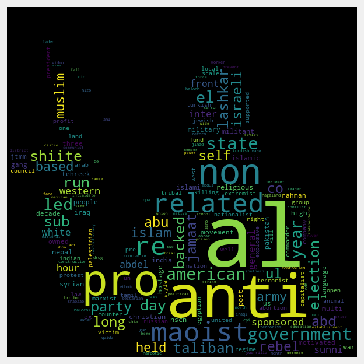

In [27]:
import nltk
from wordcloud import WordCloud, STOPWORDS
motive=terror['Motive'].str.lower().str.replace(r'\|', ' ').str.cat(sep=' ')
words=nltk.tokenize.word_tokenize(motive)
word_dist = nltk.FreqDist(words)
stopwords = nltk.corpus.stopwords.words('english')
f1=open("kaggle.png", "wb")
f1.write(codecs.decode(kaggle,'base64'))
f1.close()
img1 = imread("kaggle.png")
hcmask1 = img1
words_except_stop_dist = nltk.FreqDist(w for w in words if w not in stopwords) 
wordcloud = WordCloud(stopwords=STOPWORDS,background_color='black',mask=hcmask1).generate(" ".join(words_except_stop_dist))
plt.imshow(wordcloud)
fig=plt.gcf()
fig.set_size_inches(10,6)
plt.axis('off')
plt.show()

Religious sentiments or religion looks to be the main cause of terrorism. Some of the most dangerous terrorist group names like 'al' for **al-kaeda** looks prominent. Some other words like 'government' and 'anti' also show attacks dur to resentment against the government.

### 1.9 World Terrorism Spread(Animation)

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.



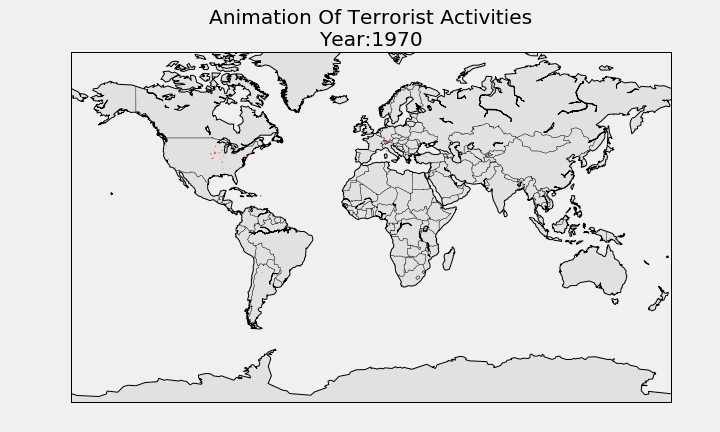

In [28]:
fig = plt.figure(figsize = (10,6))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    m6 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat6=list(terror[terror['Year']==Year].latitude)
    long6=list(terror[terror['Year']==Year].longitude)
    x6,y6=m6(long6,lat6)
    m6.scatter(x6, y6,s=[(kill+wound)*0.1 for kill,wound in zip(terror[terror['Year']==Year].Killed,terror[terror['Year']==Year].Wounded)],color = 'r')
    m6.drawcoastlines()
    m6.drawcountries()
    m6.fillcontinents(zorder = 1,alpha=0.4)
    m6.drawmapboundary()
ani = animation.FuncAnimation(fig,animate,list(terror.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

The size of the marker is relative to number of casualities(Killed+wounded).

It is visible that the Middle-East and Southern-Asia are the regions with highest terrorist activites, not only in numbers, but also in casualities. It is spreading largely across the globe but in the past few years, India, Pakistan and Afghanistan have witnessed an increase in such number of activities.

### 2.1 Predicting death occurrence in terrorist attacks

In [29]:
GTD = pd.read_csv('./globalterrorismdb_0718dist.csv', engine = 'python')

In [30]:
print("{}% of incidents occured at least one death.".format(round(float(GTD[GTD.nkill > 0]['nkill'].count())/GTD.nkill.notna().sum()*100,2)))

48.56% of incidents occured at least one death.


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]),
 <a list of 47 Text xticklabel objects>)

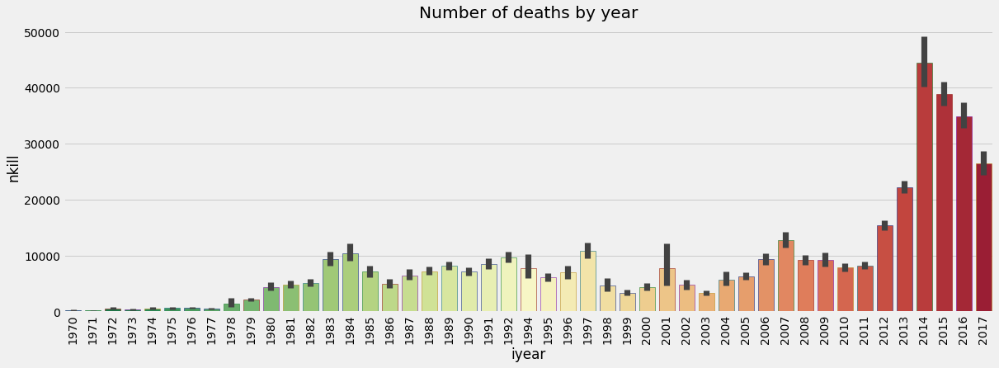

In [31]:
plt.subplots(figsize=(18,6))
ax = sns.barplot(x="iyear", y="nkill", data=GTD, estimator = sum, palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7)).set_title('Number of deaths by year')
plt.xticks(rotation=90)

### 2.2 Creating the target variable

The column `nkill` records the number of deaths in an attack.  The cell bellow picks just this feature avoiding its empty values and creating another binary feature `death` which records whether occurred or not any death in the attack.We are also going to clean the data.

In [32]:
print("GTD length before: %.2d " % len(GTD))
print("Avoiding rows with missing values of deaths...")
GTD = GTD[GTD['nkill'].notnull()]
GTD['death'] = np.where(GTD.nkill > 0, 1, 0)
GTD = GTD.drop(['nkill'], axis = 1)
print("GTD length after: %.2d " % len(GTD))

GTD length before: 181691 
Avoiding rows with missing values of deaths...
GTD length after: 171378 


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text xticklabel objects>)

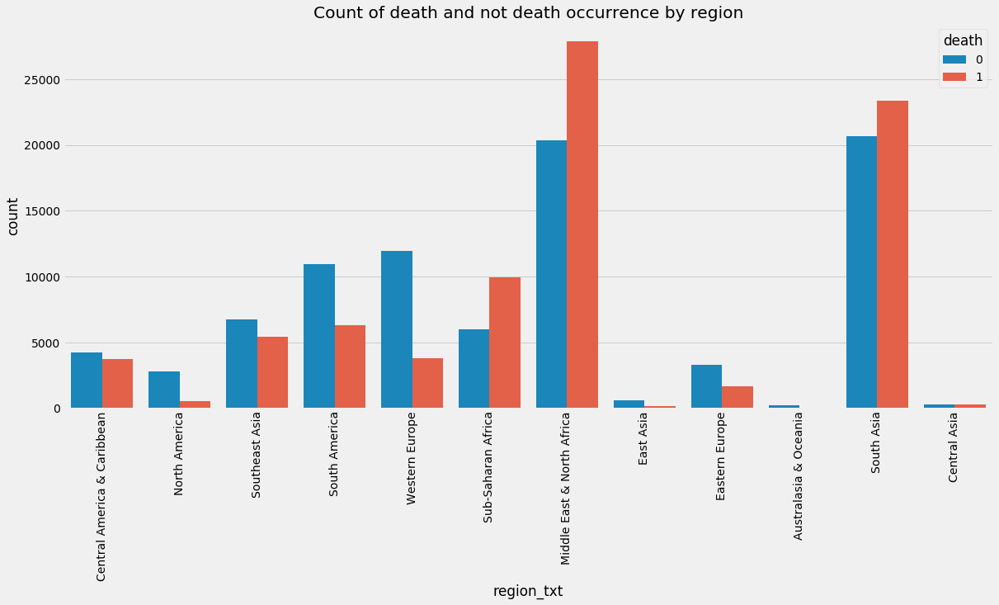

In [33]:
plt.subplots(figsize=(18,8))
ax = sns.countplot(x='region_txt', hue='death', data=GTD)
ax.set_title('Count of death and not death occurrence by region')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]), <a list of 9 Text xticklabel objects>)

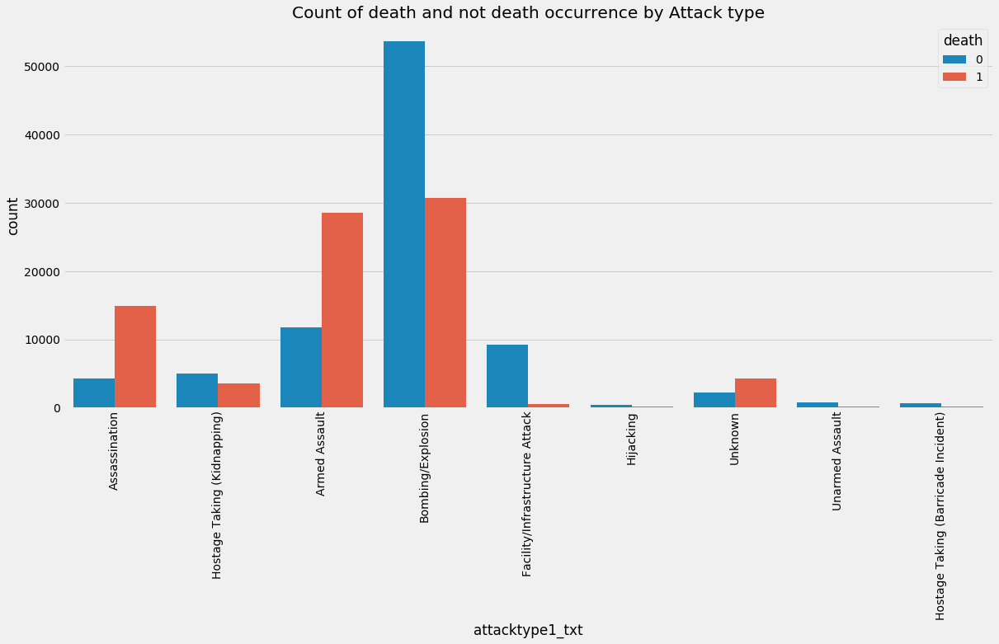

In [34]:
plt.subplots(figsize=(18,8))
ax = sns.countplot(x='attacktype1_txt', hue='death', data=GTD)
ax.set_title('Count of death and not death occurrence by Attack type')
plt.xticks(rotation=90)

### Treating Missing Values

Avoid features with more than 50% of missing values

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104]), <a list of 105 Text xticklabel objects>)

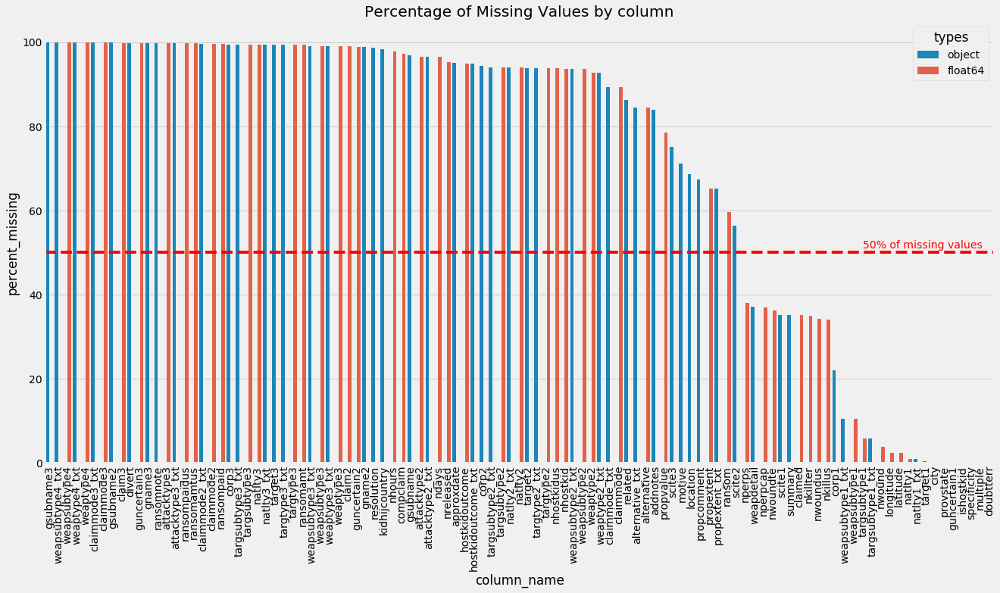

In [35]:
columns = GTD.columns
percent_missing = GTD.isnull().sum() * 100 / len(GTD)
unique = GTD.nunique()
dtypes = GTD.dtypes
missing_value_data = pd.DataFrame({'column_name': columns,
                                 'percent_missing': percent_missing,
                                 'unique': unique,
                                 'types': dtypes})
missing_value_data = missing_value_data[missing_value_data['percent_missing']>0]
missing_value_data=missing_value_data.sort_values(by=['percent_missing'], ascending=False)
plt.subplots(figsize=(20,10))
ax = sns.barplot(x="column_name", y="percent_missing", hue='types', data=missing_value_data)
ax.axhline(50, ls='--', color = 'r')
ax.text(90,51,"50% of missing values", color = 'r')
ax.set_title("Percentage of Missing Values by column")
plt.xticks(rotation=90)

In [36]:
def missing_values(data,mis_min):
    columns = data.columns
    percent_missing = data.isnull().sum() * 100 / len(data)
    unique = data.nunique()
    missing_value_data = pd.DataFrame({'column_name': columns,
                                 'percent_missing': percent_missing,
                                 'unique': unique})
    missing_drop = list(missing_value_data[missing_value_data.percent_missing>mis_min].column_name)
    return(missing_drop)

Number of remaining Features

In [37]:
print("Number of features before dropping columns with >50%% of NAN: %.1d" % GTD.shape[1])
GTD['natlty1'].fillna(GTD['country'], inplace = True)

missing_drop = missing_values(GTD,50)
GTD = GTD.drop(missing_drop, axis=1)
GTD = GTD.drop(columns = ['nkillter'])
print("Number of features after dropping columns with >50%% of NAN: %.1d" % GTD.shape[1])

Number of features before dropping columns with >50% of NAN: 135
Number of features after dropping columns with >50% of NAN: 57


Filling remaining columns with mode and median values

In [38]:
mode_fill = ['nwound','longitude','latitude','weapsubtype1','weapsubtype1_txt','targsubtype1','targsubtype1_txt','natlty1_txt','guncertain1','ishostkid', 'specificity','doubtterr','multiple', 'target1', 'city', 'provstate']
for col in mode_fill:
    GTD[col].fillna(GTD[col].mode()[0], inplace=True)

GTD['nperps'].fillna(GTD['nperps'].median(), inplace=True)
GTD['nperpcap'].fillna(GTD['nperpcap'].median(), inplace=True)
GTD['nwoundte'].fillna(GTD['nwoundte'].median(), inplace=True)
GTD['nwoundus'].fillna(GTD['nwoundus'].median(), inplace=True)
GTD['nkillus'].fillna(GTD['nkillus'].median(), inplace=True)
GTD = GTD.drop(columns = ['weapdetail', 'scite1', 'summary', 'corp1'])
GTD['claimed'].fillna(0, inplace=True)

In [39]:
print((GTD.isnull().sum(axis=0)/len(GTD)*100).sort_values(ascending=False).head(5))
print("Missing values successfully treated!!!")

death              0.0
targtype1_txt      0.0
attacktype1_txt    0.0
attacktype1        0.0
suicide            0.0
dtype: float64
Missing values successfully treated!!!


### 1.3 Transform skewed continuos features and Normalizing Numerical Features

In [40]:
GTD['suicide'] = GTD.suicide.astype('object')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1283ebb00>,
      dtype=object)

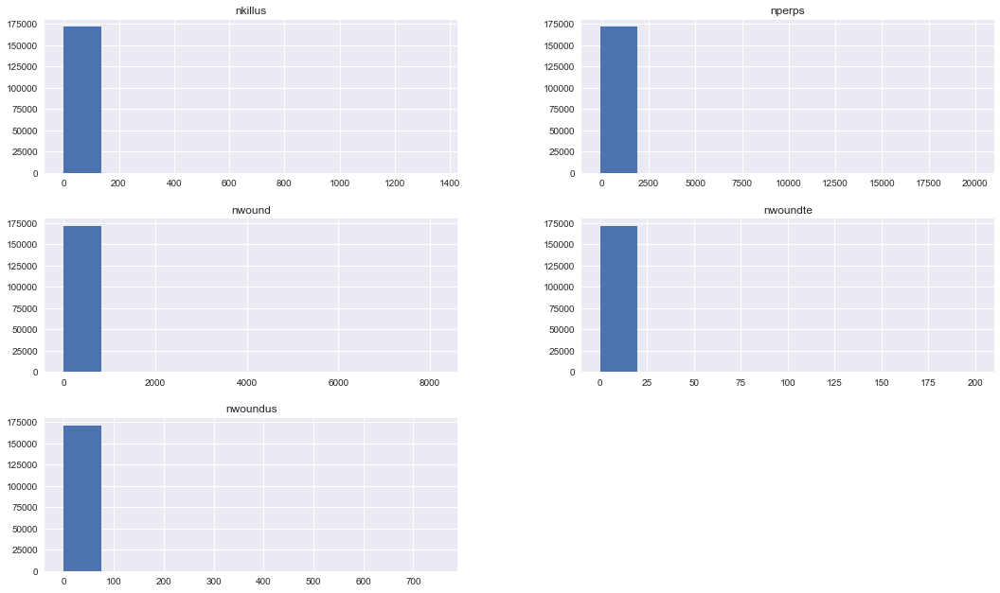

In [41]:
num_features = ['nperps','nkillus','nwound','nwoundus', 'nwoundte']
matplotlib.style.use('seaborn')
GTD[num_features].hist(figsize=(16,10))

In [42]:
from scipy.stats import skew
import sys

skewed_feat = GTD[num_features].apply(lambda x: skew(x))
skewed_feat = skewed_feat[skewed_feat > 0.75]
skewed_feat = skewed_feat.index

GTD[skewed_feat] = np.log1p(GTD[skewed_feat])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12b84bf98>,
      dtype=object)

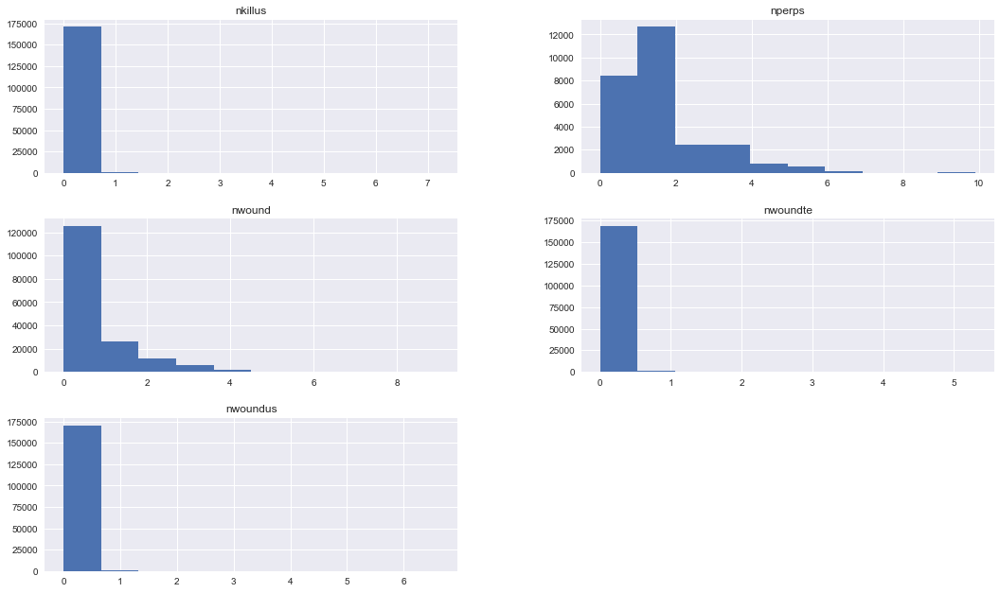

In [43]:
GTD[skewed_feat].hist(figsize=(16,10))

### Avoiding duplicated features

In [44]:
duplicated_columns = [col for col in GTD.columns if "_txt" in col]
print("There are %.2d duplicated columns to be removed"%(len(duplicated_columns)))
GTD = GTD.drop(duplicated_columns, axis=1)

There are 08 duplicated columns to be removed


### Label Encoder

In [45]:
cat_features = GTD.dtypes[GTD.dtypes == 'object'].index

from sklearn import preprocessing
le = preprocessing.LabelEncoder()

for col in cat_features:
    GTD[col] = le.fit_transform(GTD[col])

### Correlation and Most importante Features

**Correlation Matrix**

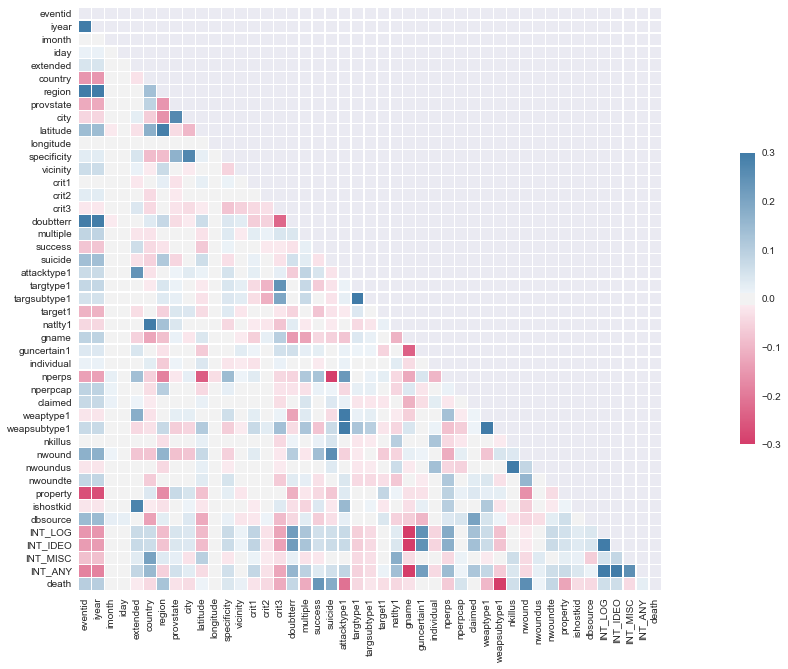

In [46]:
corr_matrix = GTD.corr()
abs(corr_matrix['death']).sort_values(ascending=False).head(10)

mask = np.zeros_like(corr_matrix, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True
plt.subplots(figsize=(25,10))
cmap = sns.diverging_palette(0,240, as_cmap = True)
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmin = -.3, vmax=.3, center=0, square=True, linewidths=.3, cbar_kws={"shrink": .5})
GTD[GTD == np.inf] = np.nan
GTD.fillna(GTD.mean(), inplace = True)

### Shuffle and Split the data

In [47]:
from sklearn.model_selection import train_test_split

income = GTD['death']

# Split the 'features' and 'income' data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(GTD.drop(['death'], axis=1),
                                                    income,
                                                    shuffle=True,
                                                    test_size = 0.2,
                                                    random_state = 43)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 137102 samples.
Testing set has 34276 samples.


### Benchmark Model

In [48]:
from sklearn.metrics import fbeta_score, accuracy_score
from sklearn.tree import DecisionTreeClassifier

DTC = DecisionTreeClassifier(random_state = 43)

DTC = DTC.fit(X_train, y_train)
bench_acc = accuracy_score(y_test, DTC.predict(X_test))
bench_fsc = fbeta_score(y_test, DTC.predict(X_test), 0.5)

print('-'*40)
print("Benchmark Model:")
print("Accuracy: %.2f" %round(bench_acc*100,2))
print("F_score: %.2f" %round(bench_fsc*100,2))
print('-'*40)

----------------------------------------
Benchmark Model:
Accuracy: 80.79
F_score: 80.03
----------------------------------------


### Training and Predicting Pipeline

In [49]:
import time

def train_predict(learner, sample_size, X_train, y_train, X_test, y_test): 
    
    results = {}

    start = time.time()
    learner = learner.fit(X_train[:sample_size], y_train[:sample_size])
    end = time.time()
    
    # Training time
    results['train_time'] = end - start
        
    # TODO: Get the predictions on the test set(X_test),
    #       then get predictions on the first 300 training samples(X_train) using .predict()
    start = time.time() # Get start time
    predictions_test = learner.predict(X_test)
    predictions_train = learner.predict(X_train[:300])
    end = time.time() # Get end time
    
    # TODO: Calculate the total prediction time
    results['pred_time'] = end - start
            
    # TODO: Compute accuracy on the first 300 training samples which is y_train[:300]
    results['acc_train'] = accuracy_score(y_train[:300], predictions_train)
        
    # TODO: Compute accuracy on test set using accuracy_score()
    results['acc_test'] = accuracy_score(y_test, predictions_test)
    
    # TODO: Compute F-score on the the first 300 training samples using fbeta_score()
    results['f_train'] = fbeta_score(y_train[:300], predictions_train, beta = 0.5, average = 'weighted')
        
    # TODO: Compute F-score on the test set which is y_test
    results['f_test'] = fbeta_score(y_test, predictions_test,  beta = 0.5, average = 'weighted')
       
    # Success
    print("{} trained on {} samples.".format(learner.__class__.__name__, sample_size))
        
    # Return the results
    return results

In [50]:
# TODO: Import the three supervised learning models from sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import fbeta_score
from sklearn.svm import SVC

# TODO: Initialize the three models
clf_A = KNeighborsClassifier()
clf_B = AdaBoostClassifier(random_state = 41)
clf_C = RandomForestClassifier(random_state = 41)
#clf_D = GaussianNB()

# TODO: Calculate the number of samples for 1%, 10%, and 100% of the training data
# HINT: samples_100 is the entire training set i.e. len(y_train)
    # HINT: samples_10 is 10% of samples_100 (ensure to set the count of the values to be `int` and not `float`)
# HINT: samples_1 is 1% of samples_100 (ensure to set the count of the values to be `int` and not `float`)
samples_100 = len(y_train)
samples_10 = int(samples_100/10)
samples_1 = int(samples_100/100)


# Collect results on the learners
results = {}
for clf in [clf_A, clf_B, clf_C]:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    for i, samples in enumerate([samples_1, samples_10, samples_100]):
        results[clf_name][i] = train_predict(clf, samples, X_train, y_train, X_test, y_test)
accuracy = bench_acc
fbeta = bench_fsc
# Run metrics visualization for the three supervised learning models chosen
#vs.evaluate(results, accuracy, fbeta)

KNeighborsClassifier trained on 1371 samples.
KNeighborsClassifier trained on 13710 samples.
KNeighborsClassifier trained on 137102 samples.
AdaBoostClassifier trained on 1371 samples.
AdaBoostClassifier trained on 13710 samples.
AdaBoostClassifier trained on 137102 samples.
RandomForestClassifier trained on 1371 samples.
RandomForestClassifier trained on 13710 samples.
RandomForestClassifier trained on 137102 samples.


In [51]:
for k, v in results.items():
    print('-'*40)
    print("Model: %s" %(k))
    for i in v:
        print("Accuraccy: %.4f \n Fscore_test: %.4f" %(v[i]['acc_test'], v[i]['f_test']))

----------------------------------------
Model: KNeighborsClassifier
Accuraccy: 0.5234 
 Fscore_test: 0.5241
Accuraccy: 0.5436 
 Fscore_test: 0.5434
Accuraccy: 0.5856 
 Fscore_test: 0.5856
----------------------------------------
Model: AdaBoostClassifier
Accuraccy: 0.7920 
 Fscore_test: 0.7923
Accuraccy: 0.8069 
 Fscore_test: 0.8070
Accuraccy: 0.8099 
 Fscore_test: 0.8099
----------------------------------------
Model: RandomForestClassifier
Accuraccy: 0.8031 
 Fscore_test: 0.8034
Accuraccy: 0.8357 
 Fscore_test: 0.8357
Accuraccy: 0.8634 
 Fscore_test: 0.8634


### Tuning the Random Forest Classifier

Avoiding features with importance below 2%

In [52]:
from sklearn.feature_selection import SelectFromModel

feat_labels = GTD.columns
sfm = SelectFromModel(clf, threshold=0.02)
sfm.fit(X_train, y_train)
important_feat = [feat_labels[col] for col in sfm.get_support(indices=True)]
#for feature_list_index in sfm.get_support(indices=True):
#    print(feat_labels[feature_list_index])
important_feat.append('death')

X_important_test = sfm.transform(X_test)
X_important_train = sfm.transform(X_train)

print('-'*40)
print('Feature Selection:')
print('before')
print(X_train.shape)
print('after')
print(X_important_train.shape)
print('-'*40)

----------------------------------------
Feature Selection:
before
(137102, 44)
after
(137102, 21)
----------------------------------------


In [53]:
rf = RandomForestClassifier(random_state = 41)
rf.fit(X_important_train, y_train)
important_pred = rf.predict(X_important_test)

print("Accuracy after Feature Selection: %.2f" %round((accuracy_score(y_test, important_pred)*100),2))
print("F_score after Feature Selection: %.2f" %round((fbeta_score(y_test, important_pred, 0.5)*100),2))

Accuracy after Feature Selection: 85.98
F_score after Feature Selection: 85.69


#### Validation Set

In [54]:
X_intermediate, X_test, y_intermediate, y_test = train_test_split(GTD.drop(['death'], axis=1),
                                                                  income,
                                                                  shuffle=True,
                                                                  test_size = 0.2,
                                                                  random_state = 43)

X_train, X_validation, y_train, y_validation = train_test_split(X_intermediate,
                                                                y_intermediate,
                                                                shuffle=False,
                                                                test_size=0.2,
                                                                random_state=43)
# delete intermediate variables
del X_intermediate, y_intermediate

# print proportions
print('train: {}% | validation: {}% | test {}%'.format(round(float(len(y_train))/len(income),2),
                                                       round(float(len(y_validation))/len(income),2),
                                                       round(float(len(y_test))/len(income),2)))

train: 0.64% | validation: 0.16% | test 0.2%


In [55]:
rf.fit(X_train, y_train)

print('-'*40)
print("Train:")
print("Accuracy: %.2f" %round((accuracy_score(y_train, rf.predict(X_train))*100),2))
print("F_score: %.2f" %round((fbeta_score(y_train, rf.predict(X_train), 0.5)*100),2))
print('-'*40)
print("Validation:")
print("Accuracy: %.2f" %round((accuracy_score(y_validation, rf.predict(X_validation))*100),2))
print("F_score: %.2f" %round((fbeta_score(y_validation, rf.predict(X_validation), 0.5)*100),2))
print('-'*40)
print("Test:")
print("Accuracy: %.2f" %round((accuracy_score(y_test, rf.predict(X_test))*100),2))
print("F_score: %.2f" %round((fbeta_score(y_test, rf.predict(X_test), 0.5)*100),2))
print('-'*40)

----------------------------------------
Train:
Accuracy: 99.94
F_score: 99.93
----------------------------------------
Validation:
Accuracy: 86.07
F_score: 85.72
----------------------------------------
Test:
Accuracy: 86.09
F_score: 85.65
----------------------------------------


##### Tunning the hyperparemeters of the model

In [56]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 2, stop = 20, num = 5)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(1, 11, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [2, 6, 11, 15, 20], 'max_features': ['auto', 'sqrt'], 'max_depth': [1, 3, 6, 8, 11, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


The highlated cell below can be used to find out the best hyperparemeters of the model to improve its accuraccy. This cell normally runs in 3 minutes,

In [57]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)
best_random = rf_random.best_estimator_
best_random

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.6min finished


RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=20,
                       n_jobs=None, oob_score=False, random_state=41, verbose=0,
                       warm_start=False)

In [58]:
best_random = RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=5,
            min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
            oob_score=False, random_state=41, verbose=0, warm_start=False)

In [59]:
new_rf = best_random
new_rf.fit(X_train, y_train)

print('-'*40)
print("Test:")
print("Accuracy: %.2f" %round((accuracy_score(y_test, new_rf.predict(X_test))*100),2))
print("F_score: %.2f" %round((fbeta_score(y_test, new_rf.predict(X_test), 0.5)*100),2))
print('-'*40)

----------------------------------------
Test:
Accuracy: 85.73
F_score: 85.26
----------------------------------------


**When happens deathes in attacks, how often the model predicts no deathes?**

This is the most critical case because the huge problem is whether the model predicts Negative for death occurrence, but the truth is Positive.

In [60]:
from sklearn import metrics

conf_matrix = metrics.confusion_matrix(y_test, new_rf.predict(X_test))
TP = conf_matrix[1, 1]
TN = conf_matrix[0, 0]
FP = conf_matrix[0, 1]
FN = conf_matrix[1, 0]
conf_mat_df = pd.DataFrame(conf_matrix).astype(int)
conf_mat_df = conf_mat_df.rename(index={0:"no_death_true"})
conf_mat_df = conf_mat_df.rename(index={1:"death_true"})
conf_mat_df = conf_mat_df.rename(columns={0:"no_death_pred"})
conf_mat_df = conf_mat_df.rename(columns={1:"death_pred"})
print("Given death occurrance in attacks, the model mistakenly predicted no deathes in {}% cases.".format(round(float(FN)/(FN+TP)*100,2)))

Given death occurrance in attacks, the model mistakenly predicted no deathes in 14.93% cases.


Text(0.5, 1, 'Confusion Matrix')

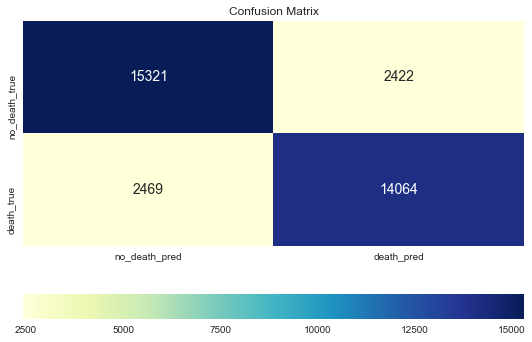

In [61]:
grid_kws = {"height_ratios": (.8, .05), "hspace": .3}
ax = sns.heatmap(conf_mat_df, annot = True, fmt='d', cmap="YlGnBu",  cbar_kws={"orientation": "horizontal"})
ax.set_title("Confusion Matrix")

Only 2422 times model predicted wrong. So we can say that our intial goal to predict death accurance completed with only 14.93% cases. 